# Lewagon X Femtasy 

## Hard Coded Info

In [1]:
# Dictionary to translate content_type integer into Category
content_type_dict = {1 : 'Soul',
                     2 : 'Sounds',
                     3 : 'Stories',
                     4 : 'Series',
                    }

In [2]:
user_kinks_10 = ['In public', # not in df
                 'At home',
                 'With a stranger',
                 'Authority',
                 'BDSM',
                 'Roleplay',
                 'Quickie',
                 'Group Sex',
                 'Queer',
                 'Toys', # not in df
]

In [3]:
# Dictionary with labels of language intensity 
language_intensity_dict = {'Soft' : 1,
                           'Intense': 2,
                           'Rough': 3,
                          }

In [4]:
# Dictionary with labels of genre factorization
genre_dict = {'Meditations' : 1,
              'Affirmations': 2,
              'Love Letters': 3,
              'Guided Masturbation': 4,
              'Moaning Sounds': 5,
              'Sounds of Lovers': 6,
              '360° Audios': 7,
              'Sex Sounds': 8,
              'Phone Sex': 9,
              'Erotic Stories': 10,
             }

In [5]:
#voice actor name from the website with how many uploads 
''' emanuel 96
    keno 86
    lia 32
    marie 40
    nela 85
    paul 14
    raphael 168
    samuel 120
    a.i. & u.j. 4
    anonym 43
    a.p. & i.z. 4
    ava 74
    celine 7
    c.f. 2
    claire 8 
    david 5
    e.g. 2
    elena 25
    emilia 8
    esme 47
    gabriel & eva 12
    Hannah 3
    inja 3
    ivy 19
    j.a. 2
    jackson 21
    james 16
    j.e. 2
    josha 35
    j.w. 2
    k.u. 2
    l.d. 2
    l.d. & s.m. 4
    lena 3
    lennard 4
    leo 93
    levi 19
    lewis 109
    lilly 6 
    lorena 40
    luc 9
    lucia & diego 12
    luis 24
    lukas 3
    marco 9 
    milo 17
    mira 21
    m.k. 2
    m.r. 2 
    neilo 123
    n.l. 2
    o.f 2
    pantea 57
    philippe 96
    p.l 2
    ron 27
    serena 3
    s.i. 2
    s.o. 2
    sofia 21
    t.a. 23
    theo 27
    thiago 24
    tim & livia 10
    t.m. 2
    tom 8
    tristan 6
    u.h. 2
    valeria 4
    viktor 29
    w.b. 2
    x.u. 2
    y.h. 2
    zoe & noah 14
    '''

' emanuel 96\n    keno 86\n    lia 32\n    marie 40\n    nela 85\n    paul 14\n    raphael 168\n    samuel 120\n    a.i. & u.j. 4\n    anonym 43\n    a.p. & i.z. 4\n    ava 74\n    celine 7\n    c.f. 2\n    claire 8 \n    david 5\n    e.g. 2\n    elena 25\n    emilia 8\n    esme 47\n    gabriel & eva 12\n    Hannah 3\n    inja 3\n    ivy 19\n    j.a. 2\n    jackson 21\n    james 16\n    j.e. 2\n    josha 35\n    j.w. 2\n    k.u. 2\n    l.d. 2\n    l.d. & s.m. 4\n    lena 3\n    lennard 4\n    leo 93\n    levi 19\n    lewis 109\n    lilly 6 \n    lorena 40\n    luc 9\n    lucia & diego 12\n    luis 24\n    lukas 3\n    marco 9 \n    milo 17\n    mira 21\n    m.k. 2\n    m.r. 2 \n    neilo 123\n    n.l. 2\n    o.f 2\n    pantea 57\n    philippe 96\n    p.l 2\n    ron 27\n    serena 3\n    s.i. 2\n    s.o. 2\n    sofia 21\n    t.a. 23\n    theo 27\n    thiago 24\n    tim & livia 10\n    t.m. 2\n    tom 8\n    tristan 6\n    u.h. 2\n    valeria 4\n    viktor 29\n    w.b. 2\n    x.u. 2\n   

## Data

In [6]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import datetime

In [7]:
#df = pd.read_excel('/Users/sophiemartusewicz/code/SophieMartusewicz/lewagonXfemtasy/raw_data/raw_data.xlsx')
path_data = os.path.join('..', 'lewagonXfemtasy', 'raw_data', 'raw_data.xlsx')
df = pd.read_excel(path_data)

In [8]:
#df['Anonymized Story IDs'].value_counts()[df['Anonymized Story IDs'].value_counts() > 5]

In [9]:
# Rename unnamed column to 'fantasies'
'''
In clean.py
'''
def rename_col_names(df):
  df = df.rename(columns={'Unnamed: 11': 'fantasies',
                          'Status Labels': 'longterm',
                          'Anonymized ID': 'user',
                          'Anonymized Story IDs': 'story_id',
                          'Anonymized Voice IDs': 'voice_id',
                          'Voice Type': 'voice_type',
                          'Genre': 'genre',
                          'Language Intensity': 'language_intensity',
                          'Story Listen Timestamp': 'timestamp',
                          'Session Breakups': 'session_breakups', 
                          'Story Release Date': 'story_release_date',
                          'Kinkiness Score': 'kinky_score',
                          'Content Types': 'content_type', 
                          'Story Duration': 'story_duration',
                          'Play Duration': 'play_duration'})
  return df

df = rename_col_names(df)

In [10]:
def bin_encode_longterm(df):
  df['longterm'] = df['longterm'].replace(['Long-Term Active','Short-Term Active'],[1,0])
  return df

df = bin_encode_longterm(df)

In [11]:
#rename/ numerically label the data 
def num_encode_genre(df):
  df['genre'] = df['genre'].replace(genre_dict)
  return df

df = num_encode_genre(df)

In [12]:
def num_encode_language_intensity(df):
  df['language_intensity'] = df['language_intensity'].replace(language_intensity_dict)
  return df

df = num_encode_language_intensity(df)

In [13]:
df.head()

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458


In [14]:
df.shape

(26040, 15)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26040 entries, 0 to 26039
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   longterm            26040 non-null  int64         
 1   user                26040 non-null  object        
 2   story_id            26040 non-null  int64         
 3   voice_id            26040 non-null  int64         
 4   voice_type          26040 non-null  object        
 5   genre               26040 non-null  int64         
 6   language_intensity  26040 non-null  int64         
 7   timestamp           26040 non-null  datetime64[ns]
 8   session_breakups    26040 non-null  object        
 9   story_release_date  26040 non-null  datetime64[ns]
 10  kinky_score         26040 non-null  int64         
 11  fantasies           26040 non-null  object        
 12  content_type        26040 non-null  int64         
 13  story_duration      26040 non-null  int64     

In [16]:
df.describe()

,longterm,story_id,voice_id,genre,language_intensity,kinky_score,content_type,story_duration,play_duration
count,26040.000000,26040.000000,26040.000000,26040.000000,26040.000000,26040.000000,26040.000000,26040.000000,26040.000000
mean,0.397389,24972.770968,1503.432258,8.412135,2.184524,413.123310,2.578341,600.241897,291.943856
std,0.489367,10807.350812,1380.384138,1.798235,0.544793,113.056193,0.617107,317.423169,292.108823
min,0.000000,144.000000,120.000000,1.000000,1.000000,1.000000,1.000000,85.000000,60.000000
25%,0.000000,21324.000000,336.000000,8.000000,2.000000,401.000000,2.000000,361.000000,60.000000
50%,0.000000,30120.000000,1104.000000,9.000000,2.000000,402.000000,3.000000,557.000000,171.000000
75%,1.000000,33168.000000,3096.000000,10.000000,3.000000,501.000000,3.000000,782.000000,445.000000
max,1.000000,34212.000000,4416.000000,10.000000,3.000000,510.000000,4.000000,2240.000000,1805.000000


# Cleaning Data

## Duplicates

In [17]:
len(df)

26040

In [18]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
26035    False
26036    False
26037    False
26038    False
26039    False
Length: 26040, dtype: bool

In [19]:
df.duplicated().sum()

469

In [20]:
df[df.duplicated()]

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration
85,1,6142ca2b724aa3a3b2209065e97482ede5673751463831...,6828,1104,anonym,8,2,2022-07-15 14:52:44,2022-7-15-Early,2019-04-26 10:30:46,402,Quickie,2,207,207
86,1,6142ca2b724aa3a3b2209065e97482ede5673751463831...,6828,1104,anonym,8,2,2022-07-15 14:52:44,2022-7-15-Early,2019-04-26 10:30:46,402,Quickie,2,207,207
117,1,2cdabe4def61d6f60bf9aef63a691c82c769645a1139e3...,6828,1104,anonym,8,2,2022-07-15 22:24:23,2022-7-15-Late Peak,2019-04-26 10:30:46,402,Quickie,2,207,148
118,1,2cdabe4def61d6f60bf9aef63a691c82c769645a1139e3...,6828,1104,anonym,8,2,2022-07-15 22:24:23,2022-7-15-Late Peak,2019-04-26 10:30:46,402,Quickie,2,207,148
124,1,6c586b2a574b64a474856d7e5c49f118fd487f944356e9...,31224,1104,anonym,8,2,2022-07-15 11:47:27,2022-7-15-Early,2022-01-19 11:08:37,502,At home,2,617,347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22150,0,989fa7303a629b5dbdfe2386ac5518780241ca0244e6b1...,8256,936,male,10,2,2022-07-23 08:32:00,2022-7-23-OFF,2019-06-27 14:00:00,401,With a stranger,3,623,623
22876,0,5b6156a9a0e184a80b50f568fe7d23431e51e237fe16af...,33252,336,male,10,3,2022-07-23 18:12:00,2022-7-23-First Peak,2022-05-12 15:36:00,502,Voyeurism,3,934,161
23753,0,5ea616bc2c63ff2d522fded14d104ff1903f7aa0173ba2...,31320,744,female,4,2,2022-07-23 18:48:00,2022-7-23-First Peak,2022-01-27 15:07:00,401,Guided,1,1805,1805
24074,0,6074e3fe6302bec18d213ad195967585b423cd4b741c2d...,33012,336,male,9,3,2022-07-21 14:53:00,2022-7-21-Early,2022-04-14 10:29:00,501,Phone,3,386,207


In [21]:
# Drop Row-duplicates
'''
In clean.py
'''
def rm_duplicates(df):
  return df.drop_duplicates()

df = rm_duplicates(df)

## Missing Values

In [22]:
df.isnull().sum()

longterm              0
user                  0
story_id              0
voice_id              0
voice_type            0
genre                 0
language_intensity    0
timestamp             0
session_breakups      0
story_release_date    0
kinky_score           0
fantasies             0
content_type          0
story_duration        0
play_duration         0
dtype: int64

In [23]:
df.isnull().sum() / df.shape[0] * 100

longterm              0.0
user                  0.0
story_id              0.0
voice_id              0.0
voice_type            0.0
genre                 0.0
language_intensity    0.0
timestamp             0.0
session_breakups      0.0
story_release_date    0.0
kinky_score           0.0
fantasies             0.0
content_type          0.0
story_duration        0.0
play_duration         0.0
dtype: float64

# Split "Session Breakups" 

In [24]:
# Split 'Session Breakups' into single parts
'''
In clean.py
'''
def split_session_breakup_col(df):
  df['session_breakups_date'] = df['session_breakups'].str[:9]
  df['session_breakups_breakup'] = df['session_breakups'].str.slice(start=10)
  return df

df = split_session_breakup_col(df)

In [25]:
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26035,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,201,Guided,1,800,131,2022-7-27,OFF
26036,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,302,Quickie,3,535,535,2022-7-27,Early
26037,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,401,In public,3,515,512,2022-7-27,Early
26038,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,502,Voyeurism,3,472,472,2022-7-27,OFF


# Split Kinkiness Score

We are splitting the kinkscore into its 2 components for easier use: 

Kinkiness scores are on a scale of 1-510. The hundreds place shows the max kinkiness of the story’s themes, the other digits show how many tags with that kinkiness level are in the story (so a story with 10 different kink-5 tags has a score of 510)

In [26]:
'''
In clean.py
'''
def split_score(df):
  def user_kinks(value):
    if value >= 100:
      return str(value)[1:]
    else:
      return str(value)
  def user_intensity(value):
    if value >= 100:
      return str(value)[0]
    else:
      return 0
  df['audio_intensity'] = pd.to_numeric(df['kinky_score'].apply(lambda x: user_intensity(x)))
  df['audio_kinks'] = pd.to_numeric(df['kinky_score'].apply(lambda x: user_kinks(x)))
    
  return df

In [27]:
df = split_score(df)
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup,audio_intensity,audio_kinks
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak,4,1
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early,4,1
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak,2,1
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26035,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,201,Guided,1,800,131,2022-7-27,OFF,2,1
26036,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,302,Quickie,3,535,535,2022-7-27,Early,3,2
26037,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,401,In public,3,515,512,2022-7-27,Early,4,1
26038,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,502,Voyeurism,3,472,472,2022-7-27,OFF,5,2


# Percentage of Story duration played

In [28]:
'''
in preprocessors.py
'''

df['play_percentage'] = df['play_duration'] / df['story_duration']

# Counting Stuff 

In [29]:
user_count = df['user'].nunique()
user_count

4209

In [30]:
actor_count = df['voice_id'].nunique()
actor_count

99

In [31]:
# website shows 1574 stories df has only 1061
story_count = df['story_id'].nunique()
story_count

1364

In [32]:
fantasy_count = df['fantasies'].nunique()
fantasy_count

48

In [33]:
kink_count = df['kinky_score'].nunique()
kink_count
# This is not a good name and probably not useful!

32

In [34]:
df.groupby('language_intensity').count()

,longterm,user,story_id,voice_id,voice_type,genre,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage
language_intensity,,,,,,,,,,,,,,,,,,,
1,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889,1889
2,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126,17126
3,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556,6556


In [35]:
df.groupby('audio_kinks').count()

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup,audio_intensity,play_percentage
audio_kinks,,,,,,,,,,,,,,,,,,,
1,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382,15382
2,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004
3,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904,1904
4,792,792,792,792,792,792,792,792,792,792,792,792,792,792,792,792,792,792,792
5,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283
6,157,157,157,157,157,157,157,157,157,157,157,157,157,157,157,157,157,157,157
7,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15
8,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


# Value Counts

In [36]:
df['voice_type'].value_counts()

male           14244
female          4518
anonym          3518
male_female     1869
female_male     1422
Name: voice_type, dtype: int64

In [37]:
df['genre'].value_counts()

10    10965
8      6531
9      2267
7      1711
6      1671
5      1499
4       588
3       207
2       111
1        21
Name: genre, dtype: int64

In [38]:
df['kinky_score'].value_counts()

501    7952
401    4451
402    3246
502    2564
301    1512
201    1262
503    1104
302     754
504     528
202     343
103     299
104     225
403     196
101     184
505     146
105     137
3       123
303     106
506      98
102      80
203      76
106      59
508      32
1        21
304      18
4        17
2        17
507      15
404       3
509       1
204       1
510       1
Name: kinky_score, dtype: int64

1 = Soul    
2 = Sounds    
3 = Stories    
4 = Series

In [39]:
df['content_type'].value_counts()

3    14101
2     9701
1      927
4      842
Name: content_type, dtype: int64

In [40]:
df['language_intensity'].value_counts()

2    17126
3     6556
1     1889
Name: language_intensity, dtype: int64

In [41]:
df['fantasies'].value_counts()

At home                 4426
Community               3013
BDSM                    1722
Moaning                 1525
With a stranger         1515
Female-Male             1460
Voyeurism               1407
In Nature               1318
Authority               1304
In public                986
Quickie                  811
Holiday                  673
Phone                    640
Guided                   588
Queer                    582
Female-Female            561
Playing Clichés          396
Sex Club                 263
Self-Love                227
Winter                   221
Dirty Talk               194
Edging                   188
Soft BDSM                173
Couple                   165
Infidelity               158
Under the shower         145
Summer                   141
Bi-curious               127
Submission               125
Group sex                123
Loveletter                91
Pegging                   89
Sex Work                  59
Swinging                  51
Valentine's Da

In [42]:
df['session_breakups_breakup'].value_counts()

Early         10009
Late Peak      6630
First Peak     4851
OFF            4081
Name: session_breakups_breakup, dtype: int64

# Voice Popularity 

In [43]:
'''
In clean.py
'''

def voice_popularity(df):
    df['voice_popularity'] = df['voice_id'].apply(lambda x: df['voice_id'].value_counts()[x])
    return df

In [44]:
df = voice_popularity(df)
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,voice_popularity
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,Guided,1,1203,296,2022-7-15,First Peak,4,1,0.246052,623
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,Guided,1,1584,60,2022-7-16,Early,4,1,0.037879,487
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,Guided,1,800,60,2022-7-17,Late Peak,2,1,0.075000,382
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,Guided,1,1203,60,2022-7-15,Early,4,1,0.049875,623
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,Guided,1,1203,458,2022-7-15,First Peak,4,1,0.380715,623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26035,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,Guided,1,800,131,2022-7-27,OFF,2,1,0.163750,382
26036,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,Quickie,3,535,535,2022-7-27,Early,3,2,1.000000,832
26037,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,In public,3,515,512,2022-7-27,Early,4,1,0.994175,832
26038,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,Voyeurism,3,472,472,2022-7-27,OFF,5,2,1.000000,832


# Rough visualization of the data


In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

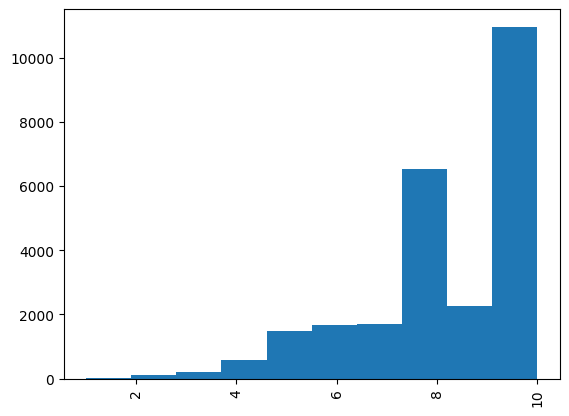

In [46]:
plt.hist(df["genre"])
plt.xticks(rotation='vertical')

plt.show()

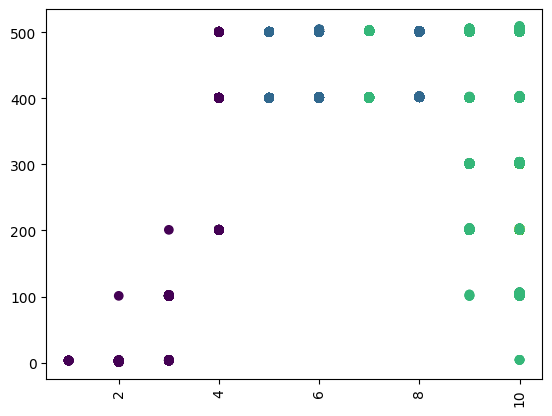

In [47]:
plt.scatter(x = df["genre"], y = df['kinky_score'], c = df["content_type"])
plt.xticks(rotation='vertical')


plt.show()

(array([  927.,     0.,     0.,  9701.,     0.,     0., 14101.,     0.,
            0.,   842.]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

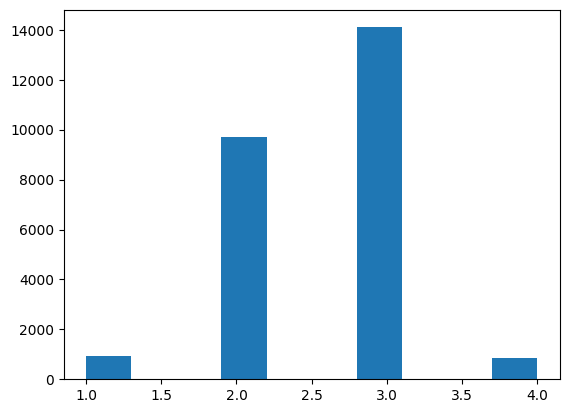

In [48]:
plt.hist(df["content_type"])

## Distributions

<Figure size 13000x18000 with 0 Axes>

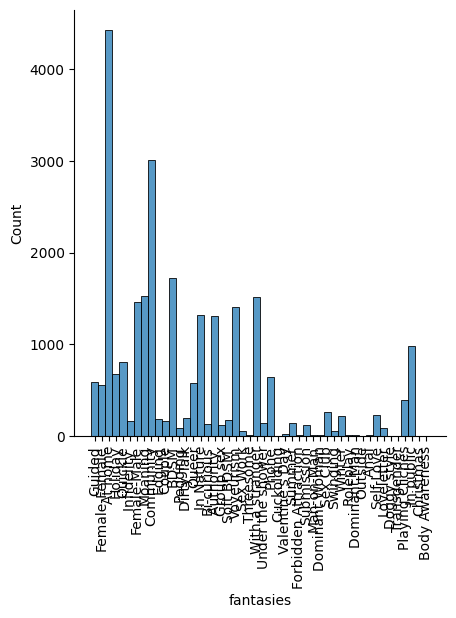

In [49]:
plt.figure(figsize=(130,180))
ax = sns.displot(df, x="fantasies", label='small')

ax.set_xticklabels(rotation=90)

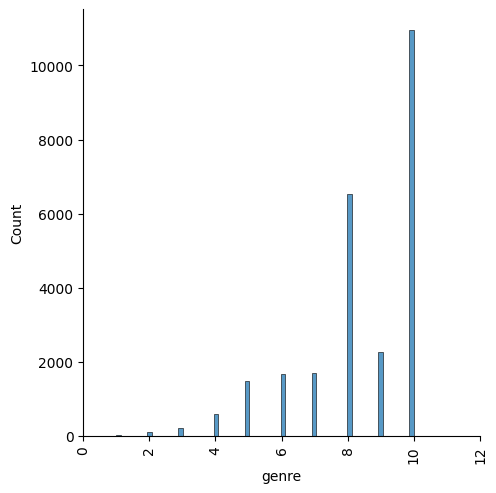

In [50]:
ax = sns.displot(df, x="genre")
ax.set_xticklabels(rotation=90)

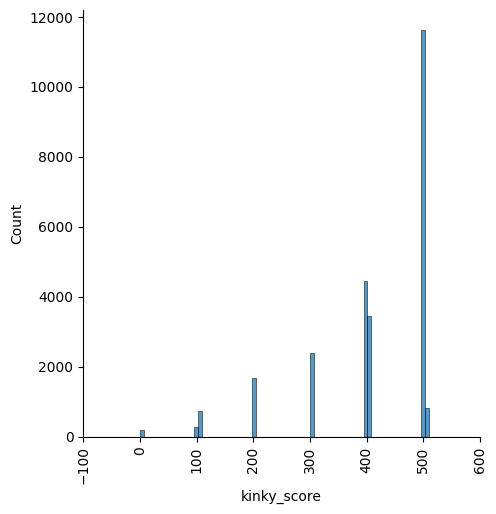

In [51]:
ax = sns.displot(df, x="kinky_score")
ax.set_xticklabels(rotation=90)

<Figure size 13000x18000 with 0 Axes>

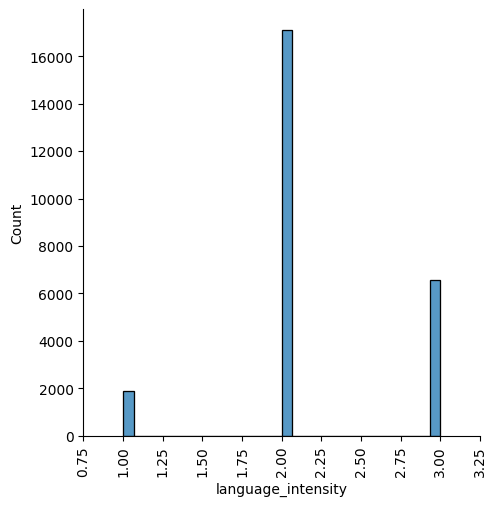

In [52]:
plt.figure(figsize=(130,180))
ax = sns.displot(df, x="language_intensity")

ax.set_xticklabels(rotation=90)

<Figure size 13000x18000 with 0 Axes>

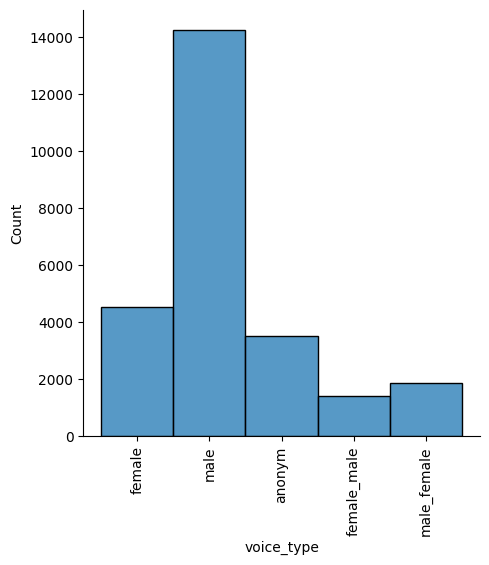

In [53]:
plt.figure(figsize=(130,180))
ax = sns.displot(df, x="voice_type")

ax.set_xticklabels(rotation=90)

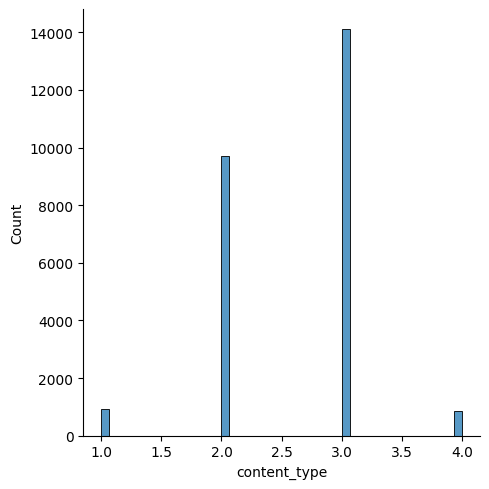

In [54]:
sns.displot(df, x="content_type")


# Scatter Matrix 

In [55]:
sns.set_theme(style="ticks")

#sns.pairplot(df, hue="fantasies")

In [56]:
#sns.pairplot(data=df, hue='audio_intensity', palette='rocket')

In [57]:
#sns.pairplot(data=df, hue='audio_kinks', palette='rocket')

In [58]:
df.corr().round(2)

,longterm,story_id,voice_id,genre,language_intensity,kinky_score,content_type,story_duration,play_duration,audio_intensity,audio_kinks,play_percentage,voice_popularity
longterm,1.00,-0.01,0.00,0.05,0.01,0.04,0.02,-0.03,0.01,0.04,0.02,0.03,0.00
story_id,-0.01,1.00,0.38,-0.28,0.04,0.13,-0.18,0.04,0.02,0.13,-0.14,0.02,-0.14
voice_id,0.00,0.38,1.00,-0.31,-0.09,0.26,-0.45,-0.32,-0.11,0.26,-0.23,0.11,-0.61
genre,0.05,-0.28,-0.31,1.00,0.24,-0.10,0.78,0.32,0.14,-0.10,0.11,-0.10,0.23
language_intensity,0.01,0.04,-0.09,0.24,1.00,0.29,0.33,0.04,-0.01,0.29,0.11,-0.07,0.02
kinky_score,0.04,0.13,0.26,-0.10,0.29,1.00,-0.18,-0.20,-0.09,1.00,-0.13,0.02,-0.05
content_type,0.02,-0.18,-0.45,0.78,0.33,-0.18,1.00,0.39,0.17,-0.18,0.21,-0.11,0.17
story_duration,-0.03,0.04,-0.32,0.32,0.04,-0.20,0.39,1.00,0.40,-0.20,0.08,-0.19,0.13
play_duration,0.01,0.02,-0.11,0.14,-0.01,-0.09,0.17,0.40,1.00,-0.09,0.03,0.71,0.04
audio_intensity,0.04,0.13,0.26,-0.10,0.29,1.00,-0.18,-0.20,-0.09,1.00,-0.14,0.02,-0.05


<AxesSubplot:>

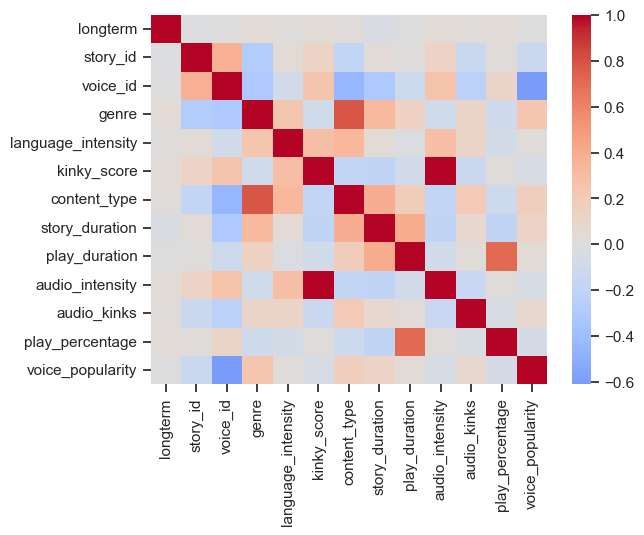

In [59]:
sns.heatmap(df.corr(), center=0, cmap='coolwarm')

<AxesSubplot:>

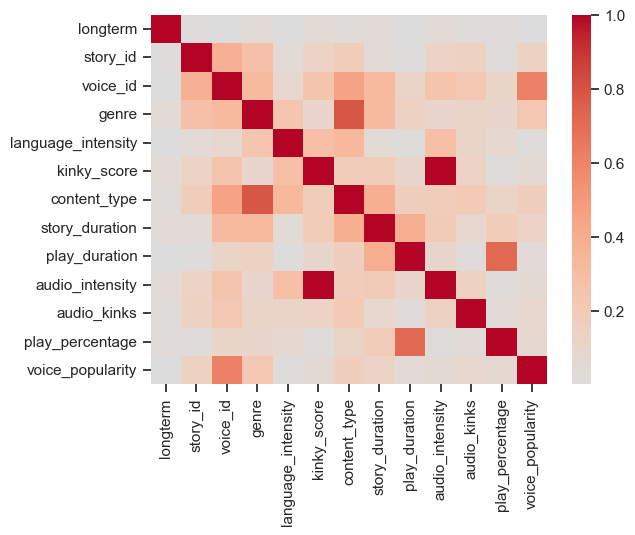

In [60]:
sns.heatmap(df.corr().abs(), center=0, cmap='coolwarm')

# User Interaction

In [61]:
# 'Soft' < 'Intense' < 'Rough'
df['language_intensity'].unique()

lang_intensity_dict = {'Soft': 1, 'Intense': 2, 'Rough': 3}
#df['Language Intensity'] = df['Language Intensity'].str.replace(lang_intensity_dict)
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,fantasies,content_type,story_duration,play_duration,session_breakups_date,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,voice_popularity
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,Guided,1,1203,296,2022-7-15,First Peak,4,1,0.246052,623
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,Guided,1,1584,60,2022-7-16,Early,4,1,0.037879,487
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,Guided,1,800,60,2022-7-17,Late Peak,2,1,0.075000,382
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,Guided,1,1203,60,2022-7-15,Early,4,1,0.049875,623
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,Guided,1,1203,458,2022-7-15,First Peak,4,1,0.380715,623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26035,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,Guided,1,800,131,2022-7-27,OFF,2,1,0.163750,382
26036,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,Quickie,3,535,535,2022-7-27,Early,3,2,1.000000,832
26037,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,In public,3,515,512,2022-7-27,Early,4,1,0.994175,832
26038,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,Voyeurism,3,472,472,2022-7-27,OFF,5,2,1.000000,832


## What actors are users listening to? 

In [62]:
pd.DataFrame(df.groupby("user")['voice_id'].value_counts())

voice_id
user                                               voice_id          
0006922a7e69784dd6165b5229534e9d9888ac6c8909f23... 216              1
                                                   744              1
0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297e... 1104             3
                                                   888              2
                                                   216              1
...                                                               ...
ffcb993fedbecf57003c135a1e110426e54322c61debc50... 3624             1
ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f9... 2904             1
                                                   3096             1
ffede371db7569f866fae1727e1da10beb92ecac68a702a... 336              1
                                                   3240             1

[15536 rows x 1 columns]

## When are users listening to stories?

In [63]:
pd.DataFrame(df.groupby("user")['timestamp'].value_counts())

timestamp
user                                               timestamp                     
0006922a7e69784dd6165b5229534e9d9888ac6c8909f23... 2022-07-19 05:11:49          1
                                                   2022-07-24 05:59:00          1
0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297e... 2022-07-23 15:40:00          2
                                                   2022-07-23 15:17:00          1
                                                   2022-07-23 15:21:00          1
...                                                                           ...
ffcb993fedbecf57003c135a1e110426e54322c61debc50... 2022-07-19 14:29:39          1
ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f9... 2022-07-19 19:50:37          1
                                                   2022-07-26 20:12:00          1
ffede371db7569f866fae1727e1da10beb92ecac68a702a... 2022-07-25 21:19:00          1
                                                   2022-07-25 21:22:00          1

[24902 rows x 1 columns]

In [64]:
pd.DataFrame(df.groupby("user")['timestamp'].count())

,timestamp
user,
0006922a7e69784dd6165b5229534e9d9888ac6c8909f2335b292620310e9813,2
0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297ef81e10a610a24f461,8
0026a96182d6614ac172e0ccaff2f071ac71208c0f8d81cbc297ff787236a7f8,1
0042b3ead482e5bfbcdb7852efed77fc55e5586b4e5f5e720a69dd543203df14,1
00445b1a5fac4af619f188bc2c90c7bc3bbbf5470873d59b604bce7466484823,2
...,...
ffbfbae77455774cab2ce1ddcd7d3157a9cb0a8ae316061dd85843557de82a32,13
ffc0b5fe473e67222acba4378f38e7261e9989e209c3f96da6ac31d4b6ae7faa,3
ffcb993fedbecf57003c135a1e110426e54322c61debc50d10ed894cedd2e8f6,2


In [65]:
users = df['user'].unique()
num_users = len(users)

story_durations = df['story_duration'].unique()
len(story_durations)

724

# What fantasies are the users listening to?

In [66]:
pd.DataFrame(df.groupby("user")['fantasies'].value_counts())

fantasies
user                                               fantasies            
0006922a7e69784dd6165b5229534e9d9888ac6c8909f23... BDSM                1
                                                   Self-Love           1
0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297e... At home             2
                                                   Quickie             2
                                                   BDSM                1
...                                                                  ...
ffc0b5fe473e67222acba4378f38e7261e9989e209c3f96... Edging              1
ffcb993fedbecf57003c135a1e110426e54322c61debc50... Authority           2
ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f9... In public           1
                                                   Quickie             1
ffede371db7569f866fae1727e1da10beb92ecac68a702a... In public           2

[16018 rows x 1 columns]

# Exploring how many individual uploads each voice actor has


In [67]:
#how many individual voice id's
voice = df.groupby('voice_id')['story_id'].value_counts()

In [68]:
voice

voice_id  story_id
120       10956        37
          6792         21
          9156         14
          2820         13
          2964         13
                     ... 
4320      34104       177
          34116         2
4344      34188        69
          34200         1
4416      34212       102
Name: story_id, Length: 1364, dtype: int64

In [69]:
#how many uploads does each actor have 
count_actors_uploads = voice.groupby('voice_id').count().sort_values()
count_actors_uploads


voice_id
4416      1
2568      1
3888      1
3912      1
3936      1
       ... 
744      67
912      71
1248     76
216     105
336     163
Name: story_id, Length: 99, dtype: int64

In [70]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', 106,
                       'display.precision', 3,
                       ):
    print(count_actors_uploads)

voice_id
4416      1
2568      1
3888      1
3912      1
3936      1
3960      1
2688      1
4008      1
4032      1
2472      1
4056      1
3816      1
3336      1
4128      1
4152      1
4176      1
4200      1
4224      1
4248      1
264       1
4272      1
4296      1
3456      1
4104      1
2520      2
3360      2
2424      2
4344      2
2544      2
2352      2
3768      2
3480      2
4320      2
4080      2
1320      2
3792      2
3840      2
3984      2
1536      2
2976      3
2856      3
840       3
3408      3
2712      3
3432      3
3288      3
3624      3
2736      3
3696      4
2664      5
2880      5
3312      5
2400      5
3168      6
2928      6
2832      6
3096      7
3672      7
3216      7
3648      7
3000      7
3504      7
3048      8
3240      8
2904      8
2808      8
2448      8
2952      9
2496      9
768      10
3264     11
1296     13
1008     13
3120     14
288      14
3072     14
936      15
480      17
1056     17
528      17
1080     18
1104     20
1512   

In [71]:
#up1 = count_actors_uploads == 1
up1 = count_actors_uploads[count_actors_uploads == 1 ]
up1.count()

24

In [72]:
#up2 = count_actors_uploads == 2
up2 = count_actors_uploads[count_actors_uploads == 2 ]
up2.count()

15

In [73]:
#up3 = count_actors_uploads == 3
up3 = count_actors_uploads[count_actors_uploads == 3 ]
up3.count()

9

In [74]:
#up4_5 = count_actors_uploads =< 5
up4 = count_actors_uploads[count_actors_uploads == 4] 
up5 = count_actors_uploads[count_actors_uploads == 5]
up4_5 = up5.count() + up4.count()
up4_5

5

In [75]:
#up6 = count_actors_uploads == 6
up6 = count_actors_uploads[count_actors_uploads == 6] 
up6.count()

3

In [76]:
#up7 = count_actors_uploads == 7
up7 = count_actors_uploads[count_actors_uploads == 7] 
up7.count()

6

In [77]:
#all actors that have between 8 and 12 uploads
up12= count_actors_uploads[(count_actors_uploads <= 12)] 
up12[(count_actors_uploads >=8)].count()

9

In [78]:
#all actors that have between 13 and 16 uploads
up17= count_actors_uploads[(count_actors_uploads <= 16)] 
up17[(count_actors_uploads >=13)].count()

6

In [79]:
#all actors that have between 17 and 37 uploads
up37= count_actors_uploads[(count_actors_uploads >= 17)] 
up37[(count_actors_uploads <=37)].count()

12

In [80]:
#all actors that have more than 37 uploads
up37= count_actors_uploads[(count_actors_uploads > 37)] 
up37.count()

10

# Time Differencing => Sessionizing

- Group by 'user' and 'timestamp'
- Preparation of columns 'time_diff_user' and 'session_id'

In [81]:
df_users_grouped = pd.DataFrame( df.groupby(['user', 'timestamp']).count()['longterm'] ).sort_values(by=['user', 'timestamp'])
df_users_grouped = df_users_grouped.reset_index(level=1)
df_users_grouped[0] = np.nan
df_users_grouped = df_users_grouped.rename(columns={0: 'time_diff_user'})
df_users_grouped['session_id'] = np.nan
df_users_grouped = df_users_grouped.drop(labels='longterm', axis=1)

## Time differencing on a user basis

Each user's 1st audio is the initial one and gets a timedelta of 0, while the user's subsequent are marked with the timedelta in between this and the initial one.

In [82]:
import itertools

tmp_list = []
for user in df_users_grouped.index.unique():
    if type(df_users_grouped.loc[user]['timestamp']) == pd.Timestamp:
        tmp_list.append(pd.NaT)
    elif type(df_users_grouped.loc[user]['timestamp']) == pd.Series:
        tmp_list.append(list(df_users_grouped.loc[user]['timestamp'].diff()))
        
def transform(nested_list):
    regular_list = []
    for ele in nested_list:
        if type(ele) is list:
            regular_list.append(ele)
        else:
            regular_list.append([ele])
    return regular_list

tmp_list = transform(tmp_list)
tmp_list = list(itertools.chain(*tmp_list))
tmp_list
df_users_grouped['time_diff_user'] = tmp_list
df_users_grouped = df_users_grouped.reset_index()
df_users_grouped['time_diff_user'] = df_users_grouped['time_diff_user'].fillna(datetime.timedelta(0))
#df_users_grouped

`SESSION_LENGTH` is a chosen value that influences the 'definition' of a session:

- All audios that are played within the value of `SESSION_LENGTH` after playing another audio belong to the same session 

In [83]:
SESSION_LENGTH = datetime.timedelta(minutes=30)

session_id_counter = 0
for idx, row in df_users_grouped.iterrows():
    if (df_users_grouped['user'] != df_users_grouped['user'].shift(1))[idx] or (df_users_grouped['time_diff_user'] > SESSION_LENGTH)[idx]:
        session_id_counter += 1
    df_users_grouped.at[idx, 'session_id'] = session_id_counter
df_users_grouped = df_users_grouped.astype({'session_id': 'int'})
df_users_grouped

,user,timestamp,time_diff_user,session_id
0,0006922a7e69784dd6165b5229534e9d9888ac6c8909f2...,2022-07-19 05:11:49,0 days 00:00:00,1
1,0006922a7e69784dd6165b5229534e9d9888ac6c8909f2...,2022-07-24 05:59:00,5 days 00:47:11,2
2,0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297...,2022-07-23 15:17:00,0 days 00:00:00,3
3,0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297...,2022-07-23 15:21:00,0 days 00:04:00,3
4,0018ddf51fef4e2d9883ffdde2cba828c21e94bfd13297...,2022-07-23 15:25:00,0 days 00:04:00,3
...,...,...,...,...
24897,ffcb993fedbecf57003c135a1e110426e54322c61debc5...,2022-07-19 14:29:39,3 days 01:18:04,10842
24898,ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f...,2022-07-19 19:50:37,0 days 00:00:00,10843
24899,ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f...,2022-07-26 20:12:00,7 days 00:21:23,10844
24900,ffede371db7569f866fae1727e1da10beb92ecac68a702...,2022-07-25 21:19:00,0 days 00:00:00,10845


## Number of audios and length per Session

In [84]:
df_audios_per_session = pd.DataFrame(df_users_grouped.groupby('session_id').count().rename(columns={'user': 'num_audios'})['num_audios'])
df_audios_per_session['session_length'] = df_users_grouped.groupby('session_id')['time_diff_user'].sum() - df_users_grouped.groupby('session_id')['time_diff_user'].first()

df_audios_per_session

,num_audios,session_length
session_id,,
1,1,0 days 00:00:00
2,1,0 days 00:00:00
3,6,0 days 00:24:00
4,1,0 days 00:00:00
5,1,0 days 00:00:00
...,...,...
10841,1,0 days 00:00:00
10842,1,0 days 00:00:00
10843,1,0 days 00:00:00


In [85]:
df_audios_per_session[df_audios_per_session['num_audios'] > 1]

,num_audios,session_length
session_id,,
3,6,0 days 00:24:00
9,2,0 days 00:18:02
10,3,0 days 00:30:18
11,2,0 days 00:22:45
12,8,0 days 00:46:53
...,...,...
10837,3,0 days 00:35:48
10838,4,0 days 00:32:00
10839,5,0 days 00:54:00


In [86]:
df_audios_per_session[df_audios_per_session['session_length'] > datetime.timedelta(minutes=45)]

,num_audios,session_length
session_id,,
12,8,0 days 00:46:53
30,6,0 days 01:21:11
149,7,0 days 01:14:04
152,6,0 days 00:46:54
153,7,0 days 00:50:00
...,...,...
10624,12,0 days 01:08:57
10625,14,0 days 01:28:12
10630,22,0 days 02:22:04


In [87]:
df = pd.merge(df, df_users_grouped, how='left', on=['user', 'timestamp'])
df = pd.merge(df, df_audios_per_session, how='left', on='session_id')
#df2.info()
#df = df.drop('og_index', axis=1)

df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,session_breakups_date,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,voice_popularity,time_diff_user,session_id,num_audios,session_length
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,2022-7-15,First Peak,4,1,0.246052,623,0 days 00:00:00,2164,6,0 days 00:20:53
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,2022-7-16,Early,4,1,0.037879,487,0 days 00:01:47,600,2,0 days 00:01:47
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,2022-7-17,Late Peak,2,1,0.075000,382,0 days 07:36:26,10732,1,0 days 00:00:00
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,2022-7-15,Early,4,1,0.049875,623,0 days 00:00:00,7793,1,0 days 00:00:00
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,2022-7-15,First Peak,4,1,0.380715,623,0 days 00:06:56,2164,6,0 days 00:20:53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,2022-7-27,OFF,2,1,0.163750,382,0 days 00:06:00,4595,3,0 days 00:08:00
25567,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,2022-7-27,Early,3,2,1.000000,832,0 days 00:09:00,3660,4,0 days 00:24:00
25568,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,2022-7-27,Early,4,1,0.994175,832,0 days 00:04:00,3660,4,0 days 00:24:00
25569,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,2022-7-27,OFF,5,2,1.000000,832,0 days 00:00:00,3660,4,0 days 00:24:00


In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25571 entries, 0 to 25570
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype          
---  ------                    --------------  -----          
 0   longterm                  25571 non-null  int64          
 1   user                      25571 non-null  object         
 2   story_id                  25571 non-null  int64          
 3   voice_id                  25571 non-null  int64          
 4   voice_type                25571 non-null  object         
 5   genre                     25571 non-null  int64          
 6   language_intensity        25571 non-null  int64          
 7   timestamp                 25571 non-null  datetime64[ns] 
 8   session_breakups          25571 non-null  object         
 9   story_release_date        25571 non-null  datetime64[ns] 
 10  kinky_score               25571 non-null  int64          
 11  fantasies                 25571 non-null  object         
 12  cont

In [89]:
session_audio_played = []
for idx in df_audios_per_session.index:
    session_audio_played.append(df[df['session_id'] == idx]['play_duration'].sum())
df_audios_per_session['session_audio_played'] = session_audio_played
df_audios_per_session = df_audios_per_session.reset_index()
df_audios_per_session

,session_id,num_audios,session_length,session_audio_played
0,1,1,0 days 00:00:00,60
1,2,1,0 days 00:00:00,60
2,3,6,0 days 00:24:00,1376
3,4,1,0 days 00:00:00,60
4,5,1,0 days 00:00:00,207
...,...,...,...,...
10840,10841,1,0 days 00:00:00,60
10841,10842,1,0 days 00:00:00,60
10842,10843,1,0 days 00:00:00,60
10843,10844,1,0 days 00:00:00,60


In [90]:
#df_audios_per_session = df_audios_per_session.reset_index()
df = pd.merge(df, df_audios_per_session[['session_id', 'session_audio_played']], how='left', on='session_id')
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,voice_popularity,time_diff_user,session_id,num_audios,session_length,session_audio_played
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,First Peak,4,1,0.246052,623,0 days 00:00:00,2164,6,0 days 00:20:53,7465
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,Early,4,1,0.037879,487,0 days 00:01:47,600,2,0 days 00:01:47,166
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,Late Peak,2,1,0.075000,382,0 days 07:36:26,10732,1,0 days 00:00:00,60
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,Early,4,1,0.049875,623,0 days 00:00:00,7793,1,0 days 00:00:00,60
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,First Peak,4,1,0.380715,623,0 days 00:06:56,2164,6,0 days 00:20:53,7465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,OFF,2,1,0.163750,382,0 days 00:06:00,4595,3,0 days 00:08:00,864
25567,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,Early,3,2,1.000000,832,0 days 00:09:00,3660,4,0 days 00:24:00,1828
25568,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,Early,4,1,0.994175,832,0 days 00:04:00,3660,4,0 days 00:24:00,1828
25569,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,OFF,5,2,1.000000,832,0 days 00:00:00,3660,4,0 days 00:24:00,1828


In [91]:
# Nummerierung der einzelnen Audios einer Session
#df['session_sequential_number'] = df.sort_values('timestamp').groupby('session_id').cumcount() + 1
df['playing_order'] = df.sort_values('timestamp').groupby('session_id').cumcount() + 1
df['playing_order_rel'] = df['playing_order'] / df['num_audios']

In [92]:
df['prev_audio'] = df.sort_values(['session_id', 'playing_order'])['story_id'].shift(1) #.groupby('session_id').cumcount() + 1

df.loc[df['playing_order'] == 1, 'prev_audio'] = 0
df['prev_audio'] = df['prev_audio'].astype('int')
df.sort_values(['session_id', 'playing_order'])[['story_id', 'session_id', 'playing_order', 'prev_audio']]

,story_id,session_id,playing_order,prev_audio
9550,33804,1,1,0
21482,21240,2,1,0
21288,6840,3,1,0
21295,33948,3,2,6840
21293,33804,3,3,33948
...,...,...,...,...
2566,15552,10842,1,0
4437,21984,10843,1,0
12089,24516,10844,1,0
13001,30516,10845,1,0


In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25571 entries, 0 to 25570
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype          
---  ------                    --------------  -----          
 0   longterm                  25571 non-null  int64          
 1   user                      25571 non-null  object         
 2   story_id                  25571 non-null  int64          
 3   voice_id                  25571 non-null  int64          
 4   voice_type                25571 non-null  object         
 5   genre                     25571 non-null  int64          
 6   language_intensity        25571 non-null  int64          
 7   timestamp                 25571 non-null  datetime64[ns] 
 8   session_breakups          25571 non-null  object         
 9   story_release_date        25571 non-null  datetime64[ns] 
 10  kinky_score               25571 non-null  int64          
 11  fantasies                 25571 non-null  object         
 12  cont

# PCA and Clustering 

We need to label encode the categorical variables and then we can do the PCA!

In [94]:
df.dtypes

longterm                              int64
user                                 object
story_id                              int64
voice_id                              int64
voice_type                           object
genre                                 int64
language_intensity                    int64
timestamp                    datetime64[ns]
session_breakups                     object
story_release_date           datetime64[ns]
kinky_score                           int64
fantasies                            object
content_type                          int64
story_duration                        int64
play_duration                         int64
session_breakups_date                object
session_breakups_breakup             object
audio_intensity                       int64
audio_kinks                           int64
play_percentage                     float64
voice_popularity                      int64
time_diff_user              timedelta64[ns]
session_id                      

In [95]:
df_cluster = df.drop(columns = ["user", "story_id", "voice_id", "session_breakups", "session_breakups_date", "timestamp", "story_release_date", "voice_popularity"], axis =1)
# removed the time things as the data would be too hard to then encode and also waiting for justus to finish around the time 
df_cluster

,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,...,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
0,1,female,4,2,401,Guided,1,1203,296,First Peak,...,1,0.246052,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892
1,1,female,4,2,401,Guided,1,1584,60,Early,...,1,0.037879,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988
2,1,female,4,2,201,Guided,1,800,60,Late Peak,...,1,0.075000,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0
3,1,female,4,2,401,Guided,1,1203,60,Early,...,1,0.049875,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0
4,1,female,4,2,401,Guided,1,1203,458,First Peak,...,1,0.380715,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,female,4,2,201,Guided,1,800,131,OFF,...,1,0.163750,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828
25567,0,male,10,2,302,Quickie,3,535,535,Early,...,2,1.000000,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072
25568,0,male,9,3,401,In public,3,515,512,Early,...,1,0.994175,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120
25569,0,male,7,3,502,Voyeurism,3,472,472,OFF,...,2,1.000000,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0


In [96]:
numeric_columns=list(df_cluster.select_dtypes('int64').columns)
categorical_columns=list(df_cluster.select_dtypes('object').columns)

## PCA


In [97]:
X = df_cluster

In [98]:
#⚠️ Data must be centered around its mean before applying PCA ⚠️

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler,LabelBinarizer,OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder    

pipeline=ColumnTransformer([
    ('num',StandardScaler(),numeric_columns),
    ('cat',OneHotEncoder(sparse=False),categorical_columns),
])
new_X= pipeline.fit_transform(X)
new_X

array([[ 1.23350971, -2.44179483, -0.33492763, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.23350971, -2.44179483, -0.33492763, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.23350971, -2.44179483, -0.33492763, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [-0.81069488,  0.32759139,  1.50017725, ...,  0.        ,
         0.        ,  0.        ],
       [-0.81069488, -0.7801631 ,  1.50017725, ...,  0.        ,
         0.        ,  1.        ],
       [-0.81069488, -1.88791758, -0.33492763, ...,  0.        ,
         0.        ,  0.        ]])

In [99]:
pipeline.get_feature_names_out()

array(['num__longterm', 'num__genre', 'num__language_intensity',
       'num__kinky_score', 'num__content_type', 'num__story_duration',
       'num__play_duration', 'num__audio_intensity', 'num__audio_kinks',
       'num__session_id', 'num__num_audios', 'num__session_audio_played',
       'num__playing_order', 'num__prev_audio', 'cat__voice_type_anonym',
       'cat__voice_type_female', 'cat__voice_type_female_male',
       'cat__voice_type_male', 'cat__voice_type_male_female',
       'cat__fantasies_Anal', 'cat__fantasies_At home',
       'cat__fantasies_Authority ', 'cat__fantasies_BDSM',
       'cat__fantasies_Bi-curious', 'cat__fantasies_Body Awareness',
       'cat__fantasies_Christmas', 'cat__fantasies_Community',
       'cat__fantasies_Couple', 'cat__fantasies_Cuckolding',
       'cat__fantasies_Dirty Talk', 'cat__fantasies_Doggy style',
       'cat__fantasies_Dominant Man', 'cat__fantasies_Dominant Woman',
       'cat__fantasies_Edging', 'cat__fantasies_Female-Female',
       '

In [100]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 18).fit(new_X)
pca

PCA(n_components=18)

In [101]:
pca.explained_variance_ratio_

array([0.18299031, 0.1576739 , 0.12403204, 0.07100162, 0.06249264,
       0.05985239, 0.05749355, 0.04953368, 0.04034423, 0.03339283,
       0.02132426, 0.01987009, 0.0157136 , 0.01355487, 0.01337884,
       0.01045919, 0.00975589, 0.00683363])

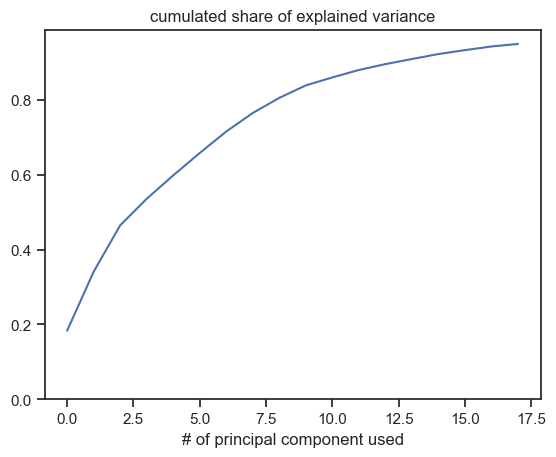

In [102]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.ylim(ymin=0)
plt.title('cumulated share of explained variance')
plt.xlabel('# of principal component used');

In [103]:
#New dataframe used for clustering 
X_proj = pca.transform(new_X)
X_proj = pd.DataFrame(X_proj)
X_proj

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,2.466156,-0.179353,1.542889,2.209879,1.379911,0.456922,0.878196,0.005876,-1.467317,2.113655,0.640322,-0.506579,1.551932,0.221428,0.588372,-0.367051,-0.178807,-0.027225
1,0.439207,-1.295597,1.866512,2.168468,1.500412,-0.282541,0.870000,-2.224347,-1.279093,3.119303,1.136708,0.409103,0.471515,-0.339183,0.007071,-0.014559,-0.273052,-0.230160
2,-0.585425,-1.096974,3.905797,0.260033,-0.596825,1.962031,0.256085,0.062216,-2.139120,1.507811,0.666661,-0.949131,0.190310,-0.747079,-0.162571,-0.117270,-0.161114,-0.185686
3,-0.260925,-2.055823,2.064597,1.518406,-0.132576,1.375201,0.811391,-0.145073,-1.418358,2.587811,1.038071,0.360950,0.233343,-0.419816,0.112082,-0.035995,-0.150239,-0.207159
4,3.901716,0.656638,1.305447,2.093692,1.545554,0.531786,0.725831,-0.721647,-1.434427,2.280123,0.529956,-0.638457,-0.434978,0.081492,0.899958,-0.362517,-0.201749,-0.051784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0.244238,-0.527084,3.881065,0.582840,-0.523863,-0.682075,0.776855,0.021625,-1.928347,1.107110,0.845994,-0.571983,0.215528,-0.069247,0.535640,0.887870,-0.270104,-0.221474
25567,-0.242178,1.824188,0.434661,-0.276118,0.027576,-0.815669,0.001551,-0.540589,0.332173,-1.045449,-0.021078,0.730468,-0.513084,0.008898,-0.137110,-0.050708,-0.286669,-0.159047
25568,0.142689,0.712483,-1.031919,-0.027863,-0.229411,-1.105450,-0.410172,-1.007931,-1.156198,-1.060328,0.034459,0.719218,-0.168268,0.098438,-0.206002,-0.049365,-0.089600,-0.141700
25569,-0.350342,-0.589834,-1.483006,0.037615,-0.161785,-0.867540,1.121754,0.923931,-1.122219,-0.585894,-0.708861,-0.001467,0.257172,0.149798,0.400614,0.879988,0.201910,-0.047879


In [104]:
# Dataframe to understand and see the components 
pd.DataFrame(pca.components_, columns=pipeline.get_feature_names_out())

,num__longterm,num__genre,num__language_intensity,num__kinky_score,num__content_type,num__story_duration,num__play_duration,num__audio_intensity,num__audio_kinks,num__session_id,...,cat__fantasies_Transgender,cat__fantasies_Under the shower,cat__fantasies_Valentine's Day,cat__fantasies_Voyeurism,cat__fantasies_Winter,cat__fantasies_With a stranger,cat__session_breakups_breakup_Early,cat__session_breakups_breakup_First Peak,cat__session_breakups_breakup_Late Peak,cat__session_breakups_breakup_OFF
0,-0.079247,-0.261500,-0.065632,0.156300,-0.283355,-0.193221,0.015881,0.156950,-0.099040,0.003685,...,1.606841e-05,-0.002066,-0.000432,-0.008185,0.000327,-0.024898,0.016128,-0.002287,-0.004786,-0.009055
1,-0.063660,0.301548,-0.003066,-0.394148,0.361893,0.324091,0.295611,-0.395028,0.159371,-0.014534,...,1.607750e-05,0.001392,0.000993,0.003540,0.000254,0.037434,0.007104,-0.000380,-0.000712,-0.006011
2,-0.040499,-0.346661,-0.491269,-0.478163,-0.344850,-0.120278,-0.104474,-0.477149,-0.054919,-0.008413,...,1.283972e-04,0.000510,0.000490,-0.045610,0.005217,0.001675,-0.008708,0.007451,0.002274,-0.001017
3,0.040563,-0.096228,-0.262995,0.148427,-0.155873,0.440250,0.619715,0.151944,-0.439970,-0.172571,...,-6.857768e-05,0.000072,-0.000633,-0.012557,0.005494,0.017459,-0.005159,0.009878,-0.012230,0.007511
4,0.669058,-0.005730,-0.019178,-0.014068,-0.003178,-0.102860,-0.002795,-0.015779,0.206022,-0.699574,...,-2.198137e-06,0.000261,0.000413,-0.007127,-0.001384,-0.013257,-0.015686,0.015323,-0.006868,0.007231
5,0.675906,-0.032339,-0.084938,0.009068,-0.052542,-0.001408,0.173698,0.007948,0.132327,0.689977,...,1.759719e-05,0.001246,-0.000096,-0.007536,-0.001171,-0.012148,0.011180,-0.001179,-0.021193,0.011191
6,-0.231105,-0.342091,0.068313,0.085062,-0.205254,0.176193,0.288443,0.078442,0.777735,-0.028679,...,1.113597e-04,-0.003107,0.001258,0.004881,-0.004783,-0.043983,0.010680,-0.004170,-0.005356,-0.001154
7,-0.024824,0.048401,-0.046609,0.004594,0.005342,-0.234672,0.004260,0.004666,-0.009272,-0.053647,...,-3.894517e-05,0.002077,0.000095,-0.010019,-0.001206,-0.004800,0.013146,0.000372,-0.011126,-0.002392
8,-0.100881,0.407410,-0.758966,0.213313,0.125272,-0.009055,-0.126014,0.210827,0.266933,0.003928,...,-4.981842e-05,0.005790,0.000416,-0.040723,0.015113,-0.015436,-0.011654,0.007882,0.000615,0.003157
9,0.117967,-0.171717,-0.044668,0.053311,-0.061475,0.708483,-0.569690,0.053374,-0.014942,0.004868,...,-3.079377e-05,-0.001702,0.000068,0.011886,0.003448,0.014824,0.003692,0.007487,0.007707,-0.018886


## Factorize the date

In [105]:
#get all categorical columns
cat_columns = df_cluster.select_dtypes(['object']).columns

#convert all categorical columns to numeric
df_cluster[cat_columns] = df_cluster[cat_columns].apply(lambda x: pd.factorize(x)[0])

#view updated DataFrame
df_cluster

,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,...,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
0,1,0,4,2,401,0,1,1203,296,0,...,1,0.246052,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892
1,1,0,4,2,401,0,1,1584,60,1,...,1,0.037879,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988
2,1,0,4,2,201,0,1,800,60,2,...,1,0.075000,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0
3,1,0,4,2,401,0,1,1203,60,1,...,1,0.049875,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0
4,1,0,4,2,401,0,1,1203,458,0,...,1,0.380715,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,0,4,2,201,0,1,800,131,3,...,1,0.163750,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828
25567,0,1,10,2,302,4,3,535,535,1,...,2,1.000000,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072
25568,0,1,9,3,401,45,3,515,512,1,...,1,0.994175,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120
25569,0,1,7,3,502,20,3,472,472,3,...,2,1.000000,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0


## Clustering

In [106]:
from sklearn.cluster import KMeans

In [107]:
# Fit K-means
km = KMeans()
km.fit(X_proj)

KMeans()

Text(0.5, 0, 'k cluster number')

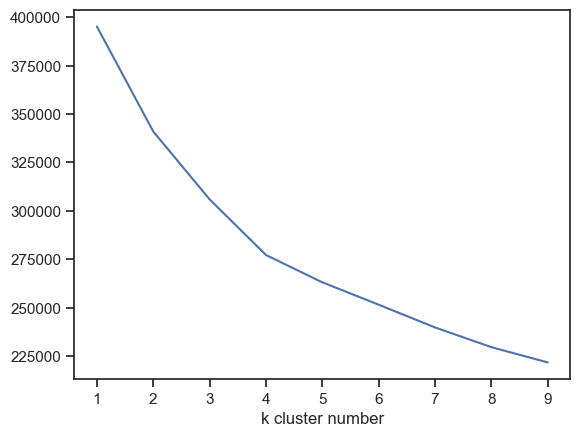

In [108]:
inertias = []
ks = range(1,10)

for k in ks:
    km_test = KMeans(n_clusters=k).fit(X_proj)
    inertias.append(km_test.inertia_)

plt.plot(ks, inertias)
plt.xlabel('k cluster number')

In [109]:
# Fit K-means with proper n of clusters
km = KMeans(n_clusters=8)
km.fit(X_proj)

KMeans()

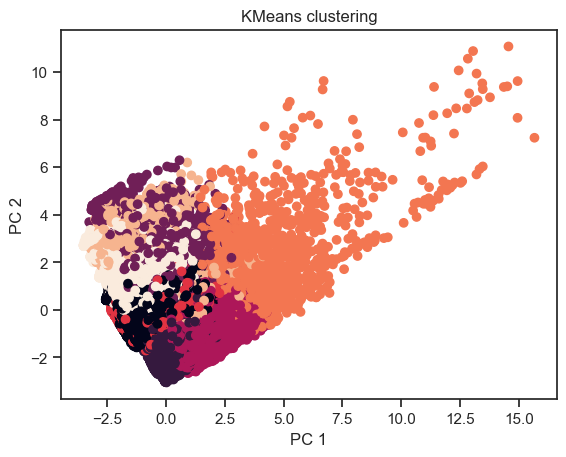

In [110]:
plt.scatter(X_proj.iloc[:,0], X_proj.iloc[:,1], c=km.labels_)
plt.title('KMeans clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2');

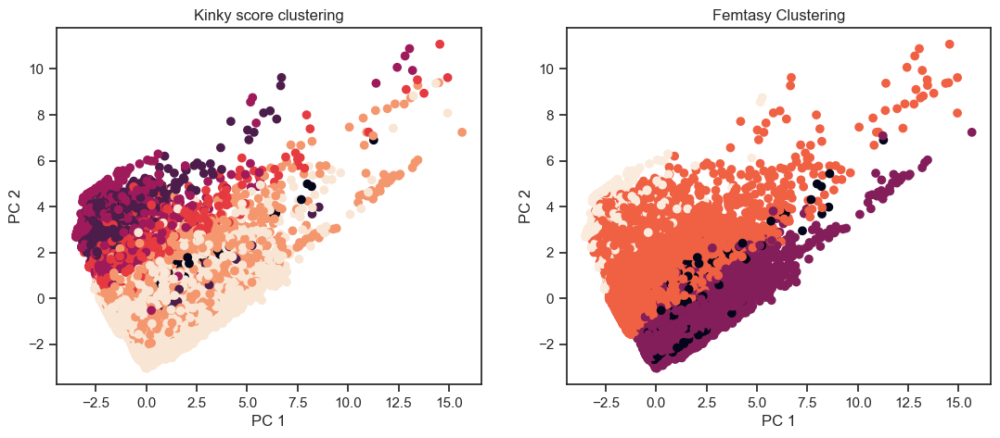

In [111]:
# Visualization
plt.figure(figsize=(13,5))

plt.subplot(1,2,1)
plt.scatter(X_proj.iloc[:,0], X_proj.iloc[:,1], c=df_cluster["kinky_score"])
plt.title('Kinky score clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2')

plt.subplot(1,2,2)
plt.scatter(X_proj.iloc[:,0], X_proj.iloc[:,1], c=df_cluster["content_type"])
plt.title('Femtasy Clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2');

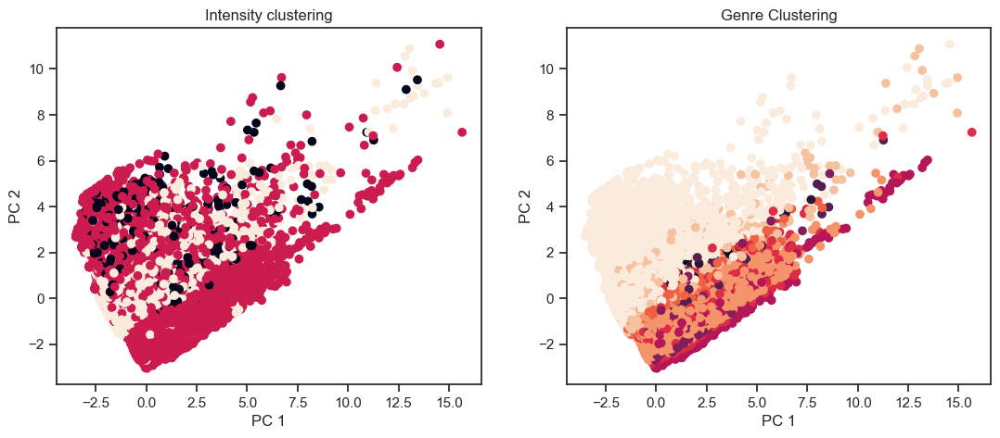

In [112]:
# Visualization
plt.figure(figsize=(13,5))

plt.subplot(1,2,1)
plt.scatter(X_proj.iloc[:,0], X_proj.iloc[:,1], c=df_cluster["language_intensity"])
plt.title('Intensity clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2')

plt.subplot(1,2,2)
plt.scatter(X_proj.iloc[:,0], X_proj.iloc[:,1], c=df_cluster["genre"])
plt.title('Genre Clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2');

We need to find a way how to cluster according a feature color we are looking for!


In [113]:
df


,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,play_percentage,voice_popularity,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,0.246052,623,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,0.037879,487,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,0.075000,382,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,0.049875,623,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,0.380715,623,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,0.163750,382,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828
25567,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,1.000000,832,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072
25568,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,0.994175,832,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120
25569,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,1.000000,832,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0


In [114]:
df_cluster

,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,...,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
0,1,0,4,2,401,0,1,1203,296,0,...,1,0.246052,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892
1,1,0,4,2,401,0,1,1584,60,1,...,1,0.037879,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988
2,1,0,4,2,201,0,1,800,60,2,...,1,0.075000,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0
3,1,0,4,2,401,0,1,1203,60,1,...,1,0.049875,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0
4,1,0,4,2,401,0,1,1203,458,0,...,1,0.380715,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,0,4,2,201,0,1,800,131,3,...,1,0.163750,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828
25567,0,1,10,2,302,4,3,535,535,1,...,2,1.000000,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072
25568,0,1,9,3,401,45,3,515,512,1,...,1,0.994175,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120
25569,0,1,7,3,502,20,3,472,472,3,...,2,1.000000,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0


In [115]:
from sklearn.neighbors import KNeighborsRegressor

df_cluster2 = df_cluster.copy()
df_cluster2['story_id'] = df['story_id']
knn_X = df_cluster2.drop(columns=['play_duration','time_diff_user', 'session_length','session_audio_played'] )
knn_y = df_cluster2['story_id']
knn_model = KNeighborsRegressor().fit(knn_X,knn_y)

In [116]:
knn_model = KNeighborsRegressor().fit(knn_X,knn_y)

In [117]:
df_cluster2

,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,...,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio,story_id
0,1,0,4,2,401,0,1,1203,296,0,...,0.246052,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892,31344
1,1,0,4,2,401,0,1,1584,60,1,...,0.037879,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988,30732
2,1,0,4,2,201,0,1,800,60,2,...,0.075000,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0,33108
3,1,0,4,2,401,0,1,1203,60,1,...,0.049875,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0,31344
4,1,0,4,2,401,0,1,1203,458,0,...,0.380715,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692,31344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,0,4,2,201,0,1,800,131,3,...,0.163750,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828,33108
25567,0,1,10,2,302,4,3,535,535,1,...,1.000000,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072,25584
25568,0,1,9,3,401,45,3,515,512,1,...,0.994175,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120,27072
25569,0,1,7,3,502,20,3,472,472,3,...,1.000000,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0,31452


In [118]:
newX = knn_X.iloc[1]

In [119]:
newX

longterm                        1.000000
voice_type                      0.000000
genre                           4.000000
language_intensity              2.000000
kinky_score                   401.000000
fantasies                       0.000000
content_type                    1.000000
story_duration               1584.000000
session_breakups_breakup        1.000000
audio_intensity                 4.000000
audio_kinks                     1.000000
play_percentage                 0.037879
session_id                    600.000000
num_audios                      2.000000
playing_order                   2.000000
playing_order_rel               1.000000
prev_audio                  32988.000000
story_id                    30732.000000
Name: 1, dtype: float64

In [120]:
#df[[df.story_id==31344]]

In [121]:
knn_model.kneighbors([newX],n_neighbors=5)

/Users/sophiemartusewicz/.pyenv/versions/3.8.12/envs/lewagon_x_femtasy/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


(array([[  0.        , 434.89206835, 533.3422916 , 616.41298181,
         644.38359165]]),
 array([[    1,  5037, 24051,  7231,  4348]]))

In [122]:
df_cluster2.iloc[4591]

longterm                                  0
voice_type                                1
genre                                     4
language_intensity                        2
kinky_score                             401
fantasies                                 0
content_type                              1
story_duration                         1688
play_duration                            60
session_breakups_breakup                  1
audio_intensity                           4
audio_kinks                               1
play_percentage                    0.035545
time_diff_user              0 days 00:01:26
session_id                              500
num_audios                                2
session_length              0 days 00:01:26
session_audio_played                    145
playing_order                             2
playing_order_rel                       1.0
prev_audio                            26892
story_id                              30756
Name: 4591, dtype: object

In [123]:
df

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,play_percentage,voice_popularity,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
0,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,...,0.246052,623,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,0.500000,17892
1,1,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,4,2,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,...,0.037879,487,0 days 00:01:47,600,2,0 days 00:01:47,166,2,1.000000,32988
2,1,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,4,2,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,...,0.075000,382,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,1.000000,0
3,1,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,4,2,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,...,0.049875,623,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,1.000000,0
4,1,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,4,2,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,...,0.380715,623,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,1.833333,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,6a83b935e48c564d1bb58634cdafd09579e80129da8ea6...,33108,672,female,4,2,2022-07-27 08:08:00,2022-7-27-OFF,2022-04-22 14:57:00,...,0.163750,382,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,0.666667,6828
25567,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,25584,3120,male,10,2,2022-07-27 09:15:00,2022-7-27-Early,2021-03-03 21:00:00,...,1.000000,832,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,1.000000,27072
25568,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,27072,3120,male,9,3,2022-07-27 09:06:00,2022-7-27-Early,2021-06-04 14:26:00,...,0.994175,832,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,0.750000,33120
25569,0,543763778ca53d9cfc6f48b94b389aec03dcc94e8b6349...,31452,3120,male,7,3,2022-07-27 08:51:00,2022-7-27-OFF,2022-02-04 14:40:00,...,1.000000,832,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0.250000,0


In [124]:
df[df.story_id == 30756]

,longterm,user,story_id,voice_id,voice_type,genre,language_intensity,timestamp,session_breakups,story_release_date,...,play_percentage,voice_popularity,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,playing_order_rel,prev_audio
29,1,9240c54fe31315de10e94e1d6b1d27c3c83e1274b4943f...,30756,336,male,4,2,2022-07-17 12:38:35,2022-7-17-Early,2021-12-10 14:56:48,...,0.035545,5084,0 days 00:15:17,6254,2,0 days 00:15:17,605,2,1.000000,3564
32,1,3749b018f0d16a2fc70700231841d53a3eef903023941d...,30756,336,male,4,2,2022-07-17 16:46:04,2022-7-17-Early,2021-12-10 14:56:48,...,0.668246,5084,0 days 00:01:24,2341,8,0 days 00:21:29,2554,6,0.750000,34128
34,1,b43e62f422f56c25e39f50ecabc89aed0a349d1853dd21...,30756,336,male,4,2,2022-07-16 23:27:53,2022-7-16-Late Peak,2021-12-10 14:56:48,...,0.035545,5084,0 days 00:12:09,7731,6,0 days 00:34:56,1876,3,0.500000,32988
35,1,d4280391806d6b59e34abf26ff9af85d54193caf3f1afb...,30756,336,male,4,2,2022-07-17 12:14:45,2022-7-17-Early,2021-12-10 14:56:48,...,0.851896,5084,0 days 00:04:35,9059,9,0 days 00:35:11,5681,7,0.777778,34020
38,1,a5ec3d825d4ba2d75d27944c21805c15fbbf90806d3f08...,30756,336,male,4,2,2022-07-18 06:08:54,2022-7-18-OFF,2021-12-10 14:56:48,...,0.035545,5084,0 days 00:00:00,7064,1,0 days 00:00:00,60,1,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25119,0,6149c2aeada44acc5194b5eb57769618987b666b98fba7...,30756,336,male,4,2,2022-07-25 21:26:00,2022-7-25-Late Peak,2021-12-10 14:56:00,...,0.035545,5084,0 days 00:08:00,4212,7,0 days 00:58:00,1746,5,0.714286,6840
25120,0,6149c2aeada44acc5194b5eb57769618987b666b98fba7...,30756,336,male,4,2,2022-07-25 21:53:00,2022-7-25-Late Peak,2021-12-10 14:56:00,...,0.035545,5084,0 days 00:18:00,4212,7,0 days 00:58:00,1746,7,1.000000,30744
25185,0,42bd0a3bcb648cfed352a3affeea85ea477b160fda511c...,30756,336,male,4,2,2022-07-24 20:14:00,2022-7-24-First Peak,2021-12-10 14:56:00,...,0.812796,5084,0 days 00:05:00,2872,4,0 days 00:30:00,2614,3,0.750000,23892
25321,0,be09d4b08cfaddb8d5bb6d18b486174a4c12092a512979...,30756,336,male,4,2,2022-07-25 21:57:00,2022-7-25-Late Peak,2021-12-10 14:56:00,...,1.000000,5084,0 days 10:22:00,8149,1,0 days 00:00:00,1688,1,1.000000,0


# Analysis of trends 

Factorize the data!!

In [125]:
df_trend = df.drop(columns = ["user", "voice_id", "session_breakups", "session_breakups_date", "timestamp", "story_release_date", "voice_popularity", 'playing_order_rel'], axis =1)

In [126]:
#get all categorical columns
cat_columns = df_trend.select_dtypes(['object']).columns

#convert all categorical columns to numeric and do plus 1 to avoid 0 values
df_trend[cat_columns] = df_trend[cat_columns].apply(lambda x: pd.factorize(x)[0]).apply(lambda x: x +1)

#view updated DataFrame
df_trend

,longterm,story_id,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,...,audio_intensity,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,prev_audio
0,1,31344,1,4,2,401,1,1,1203,296,...,4,1,0.246052,0 days 00:00:00,2164,6,0 days 00:20:53,7465,3,17892
1,1,30732,1,4,2,401,1,1,1584,60,...,4,1,0.037879,0 days 00:01:47,600,2,0 days 00:01:47,166,2,32988
2,1,33108,1,4,2,201,1,1,800,60,...,2,1,0.075000,0 days 07:36:26,10732,1,0 days 00:00:00,60,1,0
3,1,31344,1,4,2,401,1,1,1203,60,...,4,1,0.049875,0 days 00:00:00,7793,1,0 days 00:00:00,60,1,0
4,1,31344,1,4,2,401,1,1,1203,458,...,4,1,0.380715,0 days 00:06:56,2164,6,0 days 00:20:53,7465,11,31692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,0,33108,1,4,2,201,1,1,800,131,...,2,1,0.163750,0 days 00:06:00,4595,3,0 days 00:08:00,864,2,6828
25567,0,25584,2,10,2,302,5,3,535,535,...,3,2,1.000000,0 days 00:09:00,3660,4,0 days 00:24:00,1828,4,27072
25568,0,27072,2,9,3,401,46,3,515,512,...,4,1,0.994175,0 days 00:04:00,3660,4,0 days 00:24:00,1828,3,33120
25569,0,31452,2,7,3,502,21,3,472,472,...,5,2,1.000000,0 days 00:00:00,3660,4,0 days 00:24:00,1828,1,0


In [127]:
df_trend_backup = df_trend.copy()
df_trend.columns
list_group_trend = ['story_id',
                    'longterm',
                    'voice_type',
                    'genre',
                    'language_intensity',
                    'kinky_score',
                    'fantasies',
                    'content_type',
                    'story_duration',
                    'play_duration',
                    'session_breakups_breakup',
                    'audio_intensity',
                    'audio_kinks',
                    'play_percentage',
                    'time_diff_user',
                    'session_id',
                    'num_audios',
                    'session_length',
                    'session_audio_played',
                    'playing_order',
                    'prev_audio']
df_trend = pd.DataFrame(df_trend.groupby(list_group_trend).count()).reset_index()
df_trend

,story_id,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,...,audio_intensity,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,prev_audio
0,144,0,2,10,2,502,16,3,586,60,...,5,2,0.102389,0 days 00:00:00,1644,1,0 days 00:00:00,60,1,0
1,144,0,2,10,2,502,16,3,586,60,...,5,2,0.102389,0 days 00:00:00,7418,1,0 days 00:00:00,60,1,0
2,144,0,2,10,2,502,16,3,586,60,...,5,2,0.102389,0 days 00:00:00,9082,1,0 days 00:00:00,60,1,0
3,144,0,2,10,2,502,16,3,586,60,...,5,2,0.102389,0 days 00:00:00,9917,1,0 days 00:00:00,60,1,0
4,144,0,2,10,2,502,16,3,586,60,...,5,2,0.102389,0 days 00:02:00,5497,2,0 days 00:02:00,145,2,31440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,34212,1,1,8,2,502,9,2,93,92,...,5,2,0.989247,4 days 22:40:41,8914,2,0 days 00:03:00,176,1,0
25567,34212,1,1,8,2,502,9,2,93,161,...,5,2,1.731183,0 days 00:03:00,5243,11,0 days 00:13:00,3289,6,33324
25568,34212,1,1,8,2,502,9,2,93,527,...,5,2,5.666667,0 days 00:11:00,582,5,0 days 00:29:00,4613,3,33804
25569,34212,1,1,8,2,502,9,2,93,556,...,5,2,5.978495,0 days 00:05:00,582,5,0 days 00:29:00,4613,10,5160


Rank the data! 

In [128]:
#df_trend['playing_order'] = df_trend.groupby('session_id').cumcount()+1
#df_trend

In [129]:
df_trend = df_trend.reset_index()
df_trend

# We need to reset the index as then analyizing or regressing is not possible as then the datset is only seen as one column 

,index,story_id,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,...,audio_intensity,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,prev_audio
0,0,144,0,2,10,2,502,16,3,586,...,5,2,0.102389,0 days 00:00:00,1644,1,0 days 00:00:00,60,1,0
1,1,144,0,2,10,2,502,16,3,586,...,5,2,0.102389,0 days 00:00:00,7418,1,0 days 00:00:00,60,1,0
2,2,144,0,2,10,2,502,16,3,586,...,5,2,0.102389,0 days 00:00:00,9082,1,0 days 00:00:00,60,1,0
3,3,144,0,2,10,2,502,16,3,586,...,5,2,0.102389,0 days 00:00:00,9917,1,0 days 00:00:00,60,1,0
4,4,144,0,2,10,2,502,16,3,586,...,5,2,0.102389,0 days 00:02:00,5497,2,0 days 00:02:00,145,2,31440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,25566,34212,1,1,8,2,502,9,2,93,...,5,2,0.989247,4 days 22:40:41,8914,2,0 days 00:03:00,176,1,0
25567,25567,34212,1,1,8,2,502,9,2,93,...,5,2,1.731183,0 days 00:03:00,5243,11,0 days 00:13:00,3289,6,33324
25568,25568,34212,1,1,8,2,502,9,2,93,...,5,2,5.666667,0 days 00:11:00,582,5,0 days 00:29:00,4613,3,33804
25569,25569,34212,1,1,8,2,502,9,2,93,...,5,2,5.978495,0 days 00:05:00,582,5,0 days 00:29:00,4613,10,5160


# Dataset ordered and ranked! Please see if you can use this dataset


In [130]:
#df_trend2 = df_trend.copy()
#df_trend2['prev_audio_val'] = [df_trend2['playing_order'] - 1, df_trend2['session_audio_played']]
#df_trend2['prev_audio'] = df_trend2['prev_audio_val'].apply(lambda x: df_trend2.where(df_trend2['playing_order'] == x[0] and df_trend2['session_audio_played'] == x[1]))



In [131]:
from scipy import stats

story_df = df_trend.groupby('story_id').agg({
    'voice_type': np.mean,
    'genre': np.mean,
    'language_intensity': np.mean,
    'fantasies': np.mean,
    'content_type': np.mean,
    'story_duration': np.mean,
    'play_duration': np.mean,
    'session_breakups_breakup': stats.mode,
    'audio_intensity': np.mean,
    'audio_kinks': np.mean,
    'playing_order': np.mean,
    'num_audios': np.mean,
})

story_df['session_breakup_mode'] = story_df['session_breakups_breakup'].apply(lambda x: int(x[0]))
story_df['order_relative'] = story_df['playing_order'] / story_df['num_audios']
story_df = story_df.drop('session_breakups_breakup', axis=1)

# One Hot Encode:
# - voice_type
# - genre
# - content_type 



/Users/sophiemartusewicz/.pyenv/versions/3.8.12/envs/lewagon_x_femtasy/lib/python3.8/site-packages/pandas/core/groupby/groupby.py:1476: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  f = lambda x: func(x, *args, **kwargs)


In [132]:
story_df_bkp = story_df.copy()

In [133]:
story_df = story_df_bkp.copy()

In [134]:
ohe = OneHotEncoder(sparse = False) 
ohe.fit(story_df[['voice_type']])
vt_encoded = ohe.transform(story_df[['voice_type']]).astype('int')
story_df["vt_1"], story_df["vt_2"], story_df["vt_3"], story_df["vt_5"], story_df["vt_4"] = vt_encoded.T

In [135]:
vt_encoded.T

array([[0, 0, 0, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [136]:
story_df

,voice_type,genre,language_intensity,fantasies,content_type,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4
story_id,,,,,,,,,,,,,,,,,,
144,2.0,10.0,2.0,16.0,3.0,586.0,278.452381,5.0,2.0,1.611111,2.789683,2,0.577525,0,1,0,0,0
168,2.0,10.0,2.0,3.0,3.0,709.0,363.163934,5.0,2.0,2.573770,3.754098,2,0.685590,0,1,0,0,0
216,2.0,10.0,2.0,18.0,3.0,580.0,292.134328,3.0,2.0,2.104478,3.203980,2,0.656832,0,1,0,0,0
228,1.0,10.0,3.0,35.0,3.0,522.0,333.857143,5.0,1.0,2.500000,3.714286,2,0.673077,1,0,0,0,0
252,2.0,10.0,1.0,4.0,3.0,932.0,393.444444,1.0,6.0,1.944444,2.388889,2,0.813953,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34164,3.0,8.0,2.0,46.0,2.0,493.0,313.170103,5.0,1.0,2.865979,4.912371,2,0.583421,0,0,1,0,0
34176,3.0,8.0,2.0,16.0,2.0,454.0,290.948805,4.0,2.0,2.617747,4.552901,2,0.574963,0,0,1,0,0
34188,1.0,8.0,2.0,9.0,2.0,666.0,369.028986,5.0,1.0,3.550725,6.942029,2,0.511482,1,0,0,0,0


In [137]:
ohe2 = OneHotEncoder(sparse = False) 
ohe2.fit(story_df[['genre']])
genre_encoded = ohe2.transform(story_df[['genre']]).astype('int')

In [138]:
genre_encoded.T.shape

(10, 1364)

In [139]:
ohe2.get_feature_names_out()
ohe2.categories_

[array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])]

In [140]:
counter = 0
for i in ohe2.categories_[0]:
  print(i)
  story_df[f'genre_{int(i)}'] = genre_encoded.T[counter, :]
  counter += 1
story_df

1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0


,voice_type,genre,language_intensity,fantasies,content_type,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,...,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10
story_id,,,,,,,,,,,,,,,,,,,,,
144,2.0,10.0,2.0,16.0,3.0,586.0,278.452381,5.0,2.0,1.611111,...,0,0,0,0,0,0,0,0,0,1
168,2.0,10.0,2.0,3.0,3.0,709.0,363.163934,5.0,2.0,2.573770,...,0,0,0,0,0,0,0,0,0,1
216,2.0,10.0,2.0,18.0,3.0,580.0,292.134328,3.0,2.0,2.104478,...,0,0,0,0,0,0,0,0,0,1
228,1.0,10.0,3.0,35.0,3.0,522.0,333.857143,5.0,1.0,2.500000,...,0,0,0,0,0,0,0,0,0,1
252,2.0,10.0,1.0,4.0,3.0,932.0,393.444444,1.0,6.0,1.944444,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34164,3.0,8.0,2.0,46.0,2.0,493.0,313.170103,5.0,1.0,2.865979,...,0,0,0,0,0,0,0,1,0,0
34176,3.0,8.0,2.0,16.0,2.0,454.0,290.948805,4.0,2.0,2.617747,...,0,0,0,0,0,0,0,1,0,0
34188,1.0,8.0,2.0,9.0,2.0,666.0,369.028986,5.0,1.0,3.550725,...,0,0,0,0,0,0,0,1,0,0


In [141]:
ohe3 = OneHotEncoder(sparse = False) 
ohe3.fit(story_df[['content_type']])
ct_encoded = ohe3.transform(story_df[['content_type']]).astype('int')

In [142]:
ct_encoded.T.shape

(4, 1364)

In [143]:
counter = 0
for i in ohe3.categories_[0]:
  print(i)
  story_df[f'ct_{int(i)}'] = ct_encoded.T[counter, :]
  counter += 1

1.0
2.0
3.0
4.0


In [144]:
pd.set_option('display.max_columns', None)

In [145]:
story_df = story_df.astype({
    'voice_type': 'int',
    'genre': 'int',
    'language_intensity': 'int',
    'fantasies': 'int',
    'content_type': 'int',
    'story_duration': 'int',
    'audio_intensity': 'int',
    'audio_kinks': 'int',
})

In [146]:
story_df

,voice_type,genre,language_intensity,fantasies,content_type,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10,ct_1,ct_2,ct_3,ct_4
story_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
144,2,10,2,16,3,586,278.452381,5,2,1.611111,2.789683,2,0.577525,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
168,2,10,2,3,3,709,363.163934,5,2,2.573770,3.754098,2,0.685590,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
216,2,10,2,18,3,580,292.134328,3,2,2.104478,3.203980,2,0.656832,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
228,1,10,3,35,3,522,333.857143,5,1,2.500000,3.714286,2,0.673077,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
252,2,10,1,4,3,932,393.444444,1,6,1.944444,2.388889,2,0.813953,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34164,3,8,2,46,2,493,313.170103,5,1,2.865979,4.912371,2,0.583421,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
34176,3,8,2,16,2,454,290.948805,4,2,2.617747,4.552901,2,0.574963,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
34188,1,8,2,9,2,666,369.028986,5,1,3.550725,6.942029,2,0.511482,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


# Regressions across audios within sessions  


<AxesSubplot:>

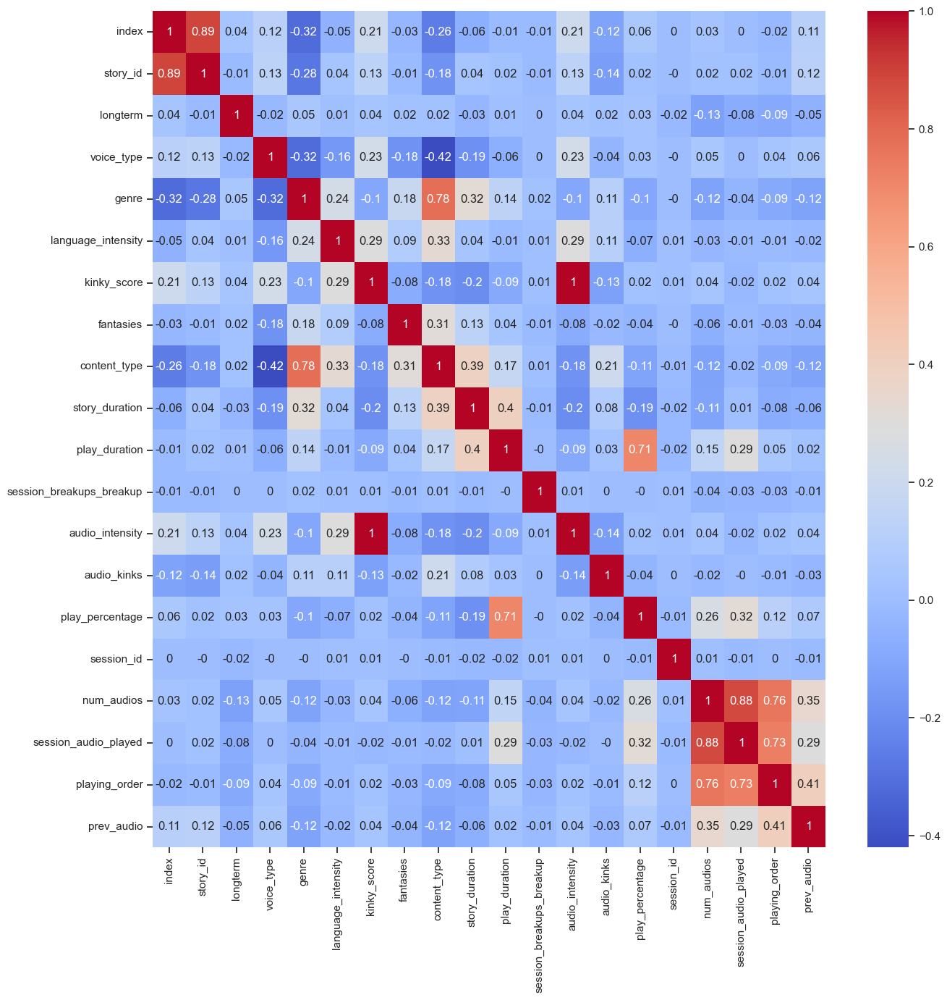

In [147]:
plt.figure(figsize = (15,15))
sns.heatmap(round(df_trend.corr(),2), cmap = "coolwarm", annot = True, annot_kws = {"size":12})

Regression with language intensity

In [148]:
import statsmodels.api as sm

Y = df_trend['language_intensity']
X = df_trend[['playing_order']]
X['intercept'] = 1


model = sm.OLS(Y, X).fit() # Finds the best beta
print(model.predict(X)) # The Y_pred (regression-line)
print(model.summary())

0        2.184305
1        2.184305
2        2.184305
3        2.184305
4        2.183327
           ...   
25566    2.184305
25567    2.179415
25568    2.182349
25569    2.175503
25570    2.180393
Length: 25571, dtype: float64
                            OLS Regression Results                            
Dep. Variable:     language_intensity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8247
Date:                Tue, 06 Sep 2022   Prob (F-statistic):              0.364
Time:                        11:09:04   Log-Likelihood:                -20759.
No. Observations:               25571   AIC:                         4.152e+04
Df Residuals:                   25569   BIC:                         4.154e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/1220039656.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='language_intensity'>

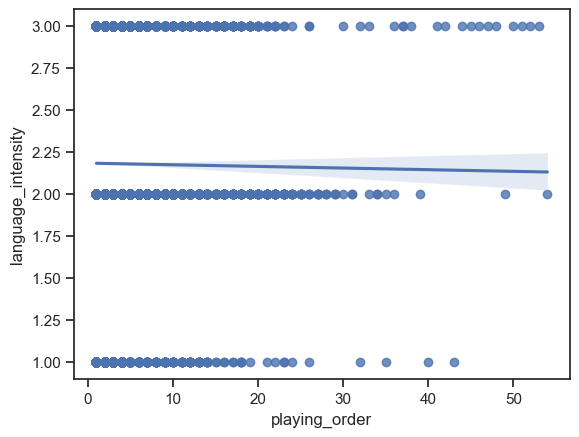

In [149]:
sns.regplot(x='playing_order', y='language_intensity', data=df_trend)

Regression with kinky score

In [150]:
import statsmodels.api as sm

Y = df_trend['kinky_score']
X = df_trend[['playing_order']]
X['intercept'] = 1

model2 = sm.OLS(Y, X).fit() # Finds the best beta
print(model2.predict(X)) # The Y_pred (regression-line)
print(model2.summary())

0        412.382785
1        412.382785
2        412.382785
3        412.382785
4        412.951398
            ...    
25566    412.382785
25567    415.225850
25568    413.520011
25569    417.500301
25570    414.657237
Length: 25571, dtype: float64
                            OLS Regression Results                            
Dep. Variable:            kinky_score   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     6.449
Date:                Tue, 06 Sep 2022   Prob (F-statistic):             0.0111
Time:                        11:09:10   Log-Likelihood:            -1.5723e+05
No. Observations:               25571   AIC:                         3.145e+05
Df Residuals:                   25569   BIC:                         3.145e+05
Df Model:                           1                                         
Covariance Type:            nonrobust  

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/4000191960.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='kinky_score'>

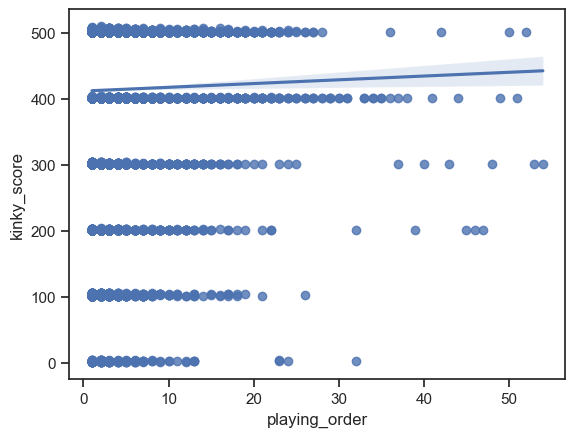

In [151]:
sns.regplot(x='playing_order', y='kinky_score', data=df_trend)

Regression with content type 

In [152]:
import statsmodels.api as sm

Y = df_trend['content_type']
X = df_trend[['playing_order']]
X['intercept'] = 1


model3 = sm.OLS(Y, X).fit() # Finds the best beta
print(model3.predict(X)) # The Y_pred (regression-line)
print(model3.summary())

0        2.612500
1        2.612500
2        2.612500
3        2.612500
4        2.595352
           ...   
25566    2.612500
25567    2.526756
25568    2.578203
25569    2.458161
25570    2.543905
Length: 25571, dtype: float64
                            OLS Regression Results                            
Dep. Variable:           content_type   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     198.7
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           5.77e-45
Time:                        11:09:15   Log-Likelihood:                -23874.
No. Observations:               25571   AIC:                         4.775e+04
Df Residuals:                   25569   BIC:                         4.777e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/1214288684.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='content_type'>

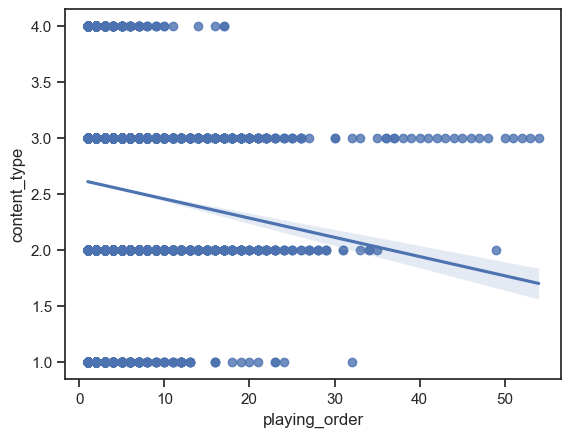

In [153]:
sns.regplot(x='playing_order', y='content_type', data=df_trend)

Regression with genre

In [154]:
import statsmodels.api as sm

Y = df_trend['genre']
X = df_trend[['playing_order']]
X['intercept'] = 1


model4 = sm.OLS(Y, X).fit() # Finds the best beta
print(model4.predict(X)) # The Y_pred (regression-line)
print(model4.summary())

0        8.506256
1        8.506256
2        8.506256
3        8.506256
4        8.452981
           ...   
25566    8.506256
25567    8.239883
25568    8.399707
25569    8.026786
25570    8.293158
Length: 25571, dtype: float64
                            OLS Regression Results                            
Dep. Variable:                  genre   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     224.9
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           1.28e-50
Time:                        11:09:21   Log-Likelihood:                -51279.
No. Observations:               25571   AIC:                         1.026e+05
Df Residuals:                   25569   BIC:                         1.026e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/472704169.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='genre'>

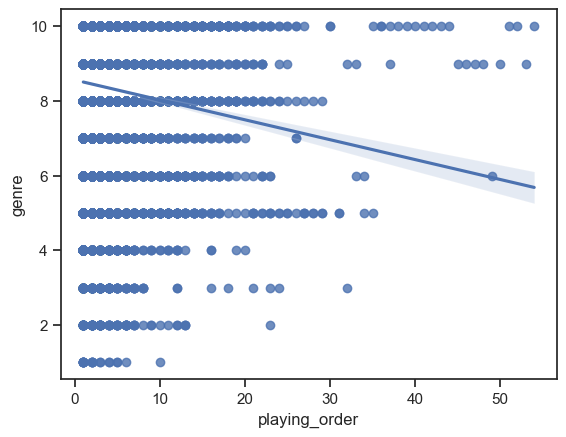

In [155]:
sns.regplot(x='playing_order', y='genre', data=df_trend)

# Regressions across the day

In [156]:
import statsmodels.formula.api as smf

model = smf.ols(formula='language_intensity ~ C(session_breakups_breakup)', data=df_trend).fit()
model.params
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     language_intensity   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     8.680
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           9.42e-06
Time:                        11:09:26   Log-Likelihood:                -20746.
No. Observations:               25571   AIC:                         4.150e+04
Df Residuals:                   25567   BIC:                         4.153e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            2.1482      0.008    274.689      0.000       2.133       2.164
C(session_breakups_breakup)[T.2]     0.0479      0.010      5.027      0.000       0.029       0.067
C(session_breakups_breakup)[T.3]     0.0393      0.010      3.815      0.000       0.019       0.059
C(session_breakups_breakup)[T.4]     0.0336      0.012      2.904      0.004       0.011       0.056
==============================================================================
Omnibus:                       34.091   Durbin-Watson:                   0.121
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.084
Skew:                           0.085   Prob(JB):                     3.97e-08
Kurtosis:                       2.945   Cond. No.                         5.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:xlabel='session_breakups_breakup', ylabel='language_intensity'>

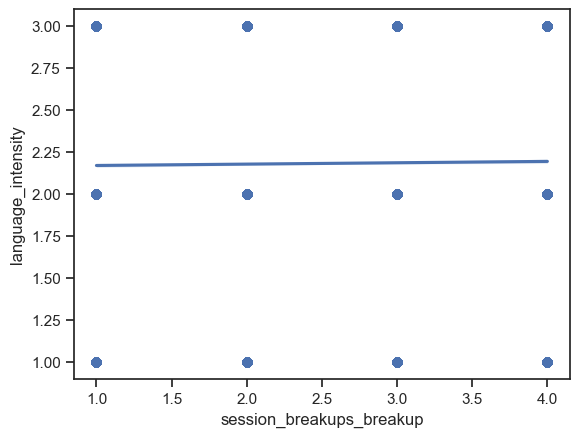

In [157]:
sns.regplot(x='session_breakups_breakup', y='language_intensity', data=df_trend)

Regression with kinky score

In [158]:
import statsmodels.formula.api as smf

model = smf.ols(formula='kinky_score ~ C(session_breakups_breakup)', data=df_trend).fit()
model.params
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            kinky_score   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     3.420
Date:                Tue, 06 Sep 2022   Prob (F-statistic):             0.0165
Time:                        11:09:31   Log-Likelihood:            -1.5723e+05
No. Observations:               25571   AIC:                         3.145e+05
Df Residuals:                   25567   BIC:                         3.145e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                          410.3684      1.627    252.281      0.000     407.180     413.557
C(session_breakups_breakup)[T.2]     4.8825      1.982      2.463      0.014       0.998       8.767
C(session_breakups_breakup)[T.3]     1.0090      2.141      0.471      0.637      -3.187       5.205
C(session_breakups_breakup)[T.4]     5.5424      2.406      2.303      0.021       0.826      10.259
==============================================================================
Omnibus:                     5727.440   Durbin-Watson:                   0.129
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            10711.513
Skew:                          -1.413   Prob(JB):                         0.00
Kurtosis:                       4.438   Cond. No.                         5.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:xlabel='session_breakups_breakup', ylabel='kinky_score'>

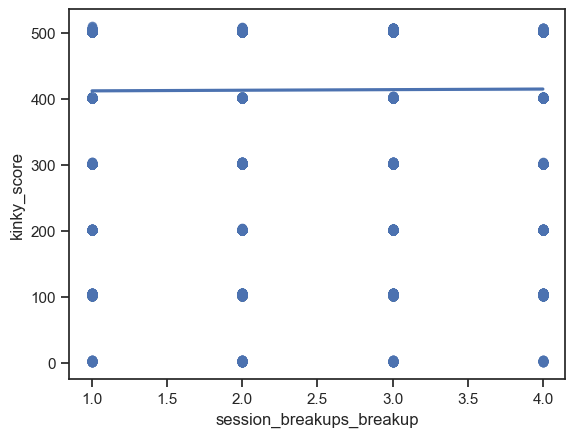

In [159]:
sns.regplot(x='session_breakups_breakup', y='kinky_score', data=df_trend)

Regression with content type 

In [160]:
import statsmodels.formula.api as smf

model = smf.ols(formula='content_type ~ C(session_breakups_breakup)', data=df_trend).fit()
model.params
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           content_type   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.247
Date:                Tue, 06 Sep 2022   Prob (F-statistic):              0.291
Time:                        11:09:37   Log-Likelihood:                -23971.
No. Observations:               25571   AIC:                         4.795e+04
Df Residuals:                   25567   BIC:                         4.798e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            2.5714      0.009    289.851      0.000       2.554       2.589
C(session_breakups_breakup)[T.2]     0.0054      0.011      0.495      0.621      -0.016       0.027
C(session_breakups_breakup)[T.3]     0.0197      0.012      1.685      0.092      -0.003       0.043
C(session_breakups_breakup)[T.4]     0.0152      0.013      1.158      0.247      -0.011       0.041
==============================================================================
Omnibus:                      512.142   Durbin-Watson:                   0.031
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              539.704
Skew:                          -0.351   Prob(JB):                    6.38e-118
Kurtosis:                       2.884   Cond. No.                         5.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:xlabel='session_breakups_breakup', ylabel='content_type'>

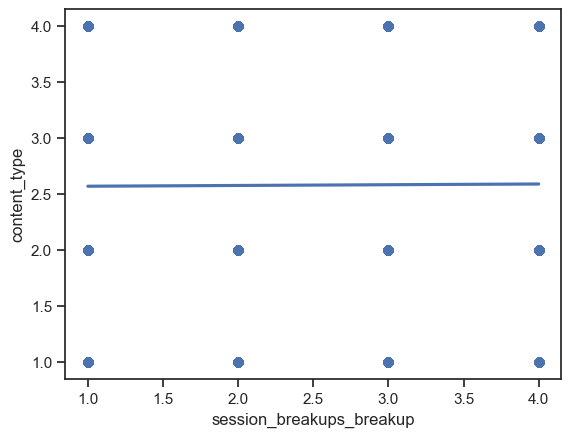

In [161]:
sns.regplot(x='session_breakups_breakup', y='content_type', data=df_trend)

Regression with genre

In [162]:
import statsmodels.formula.api as smf

model = smf.ols(formula='genre ~ C(session_breakups_breakup)', data=df_trend).fit()
model.params
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  genre   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.248
Date:                Tue, 06 Sep 2022   Prob (F-statistic):             0.0806
Time:                        11:09:42   Log-Likelihood:                -51388.
No. Observations:               25571   AIC:                         1.028e+05
Df Residuals:                   25567   BIC:                         1.028e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            8.3770      0.026    323.179      0.000       8.326       8.428
C(session_breakups_breakup)[T.2]     0.0114      0.032      0.361      0.718      -0.050       0.073
C(session_breakups_breakup)[T.3]     0.0555      0.034      1.628      0.103      -0.011       0.122
C(session_breakups_breakup)[T.4]     0.0792      0.038      2.066      0.039       0.004       0.154
==============================================================================
Omnibus:                     3687.770   Durbin-Watson:                   0.053
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5483.802
Skew:                          -1.090   Prob(JB):                         0.00
Kurtosis:                       3.626   Cond. No.                         5.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:xlabel='session_breakups_breakup', ylabel='genre'>

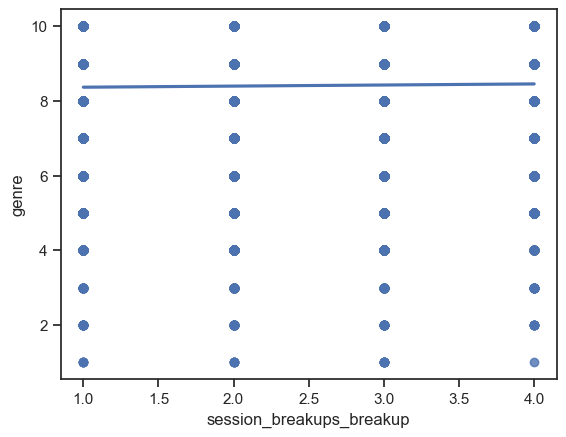

In [163]:
sns.regplot(x='session_breakups_breakup', y='genre', data=df_trend)

# Regression with only longterm users

In [164]:
df_longterm = df_trend[df_trend["longterm"] == 1]
df_longterm

,index,story_id,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,prev_audio
121,121,144,1,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,1419,1,0 days 00:00:00,60,1,0
122,122,144,1,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,5513,2,0 days 00:14:25,478,1,0
123,123,144,1,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:07:06,3913,2,0 days 00:07:06,417,2,32364
124,124,144,1,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 23:45:10,6413,1,0 days 00:00:00,60,1,0
125,125,144,1,2,10,2,502,16,3,586,60,1,5,2,0.102389,2 days 21:41:00,7138,1,0 days 00:00:00,60,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25566,25566,34212,1,1,8,2,502,9,2,93,92,4,5,2,0.989247,4 days 22:40:41,8914,2,0 days 00:03:00,176,1,0
25567,25567,34212,1,1,8,2,502,9,2,93,161,4,5,2,1.731183,0 days 00:03:00,5243,11,0 days 00:13:00,3289,6,33324
25568,25568,34212,1,1,8,2,502,9,2,93,527,2,5,2,5.666667,0 days 00:11:00,582,5,0 days 00:29:00,4613,3,33804
25569,25569,34212,1,1,8,2,502,9,2,93,556,2,5,2,5.978495,0 days 00:05:00,582,5,0 days 00:29:00,4613,10,5160


Regression with language intensity

In [165]:
import statsmodels.api as sm

Y = df_longterm['language_intensity']
X = df_longterm[['playing_order']]
X['intercept'] = 1


model = sm.OLS(Y, X).fit() # Finds the best beta
print(model.predict(X)) # The Y_pred (regression-line)
print(model.summary())

121      2.193144
122      2.193144
123      2.189676
124      2.193144
125      2.193144
           ...   
25566    2.193144
25567    2.175804
25568    2.186208
25569    2.161932
25570    2.179272
Length: 10141, dtype: float64
                            OLS Regression Results                            
Dep. Variable:     language_intensity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.369
Date:                Tue, 06 Sep 2022   Prob (F-statistic):              0.124
Time:                        11:09:47   Log-Likelihood:                -7919.9
No. Observations:               10141   AIC:                         1.584e+04
Df Residuals:                   10139   BIC:                         1.586e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/2339820073.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='language_intensity'>

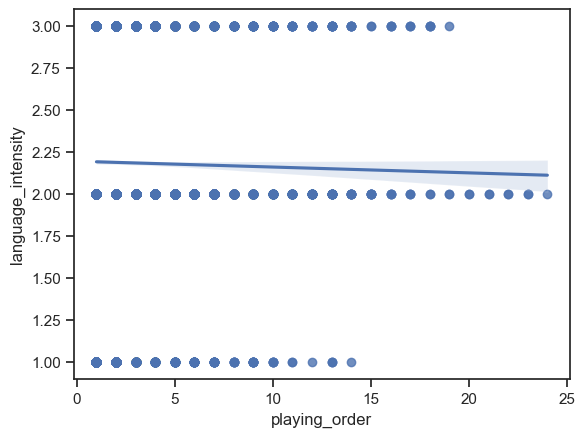

In [166]:
sns.regplot(x='playing_order', y='language_intensity', data=df_longterm)

Regression with kinky score

In [167]:
import statsmodels.api as sm

Y = df_longterm['kinky_score']
X = df_longterm[['playing_order']]
X['intercept'] = 1

model2 = sm.OLS(Y, X).fit() # Finds the best beta
print(model2.predict(X)) # The Y_pred (regression-line)
print(model2.summary())

121      418.273947
122      418.273947
123      418.846987
124      418.273947
125      418.273947
            ...    
25566    418.273947
25567    421.139147
25568    419.420027
25569    423.431307
25570    420.566107
Length: 10141, dtype: float64
                            OLS Regression Results                            
Dep. Variable:            kinky_score   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.518
Date:                Tue, 06 Sep 2022   Prob (F-statistic):              0.218
Time:                        11:09:50   Log-Likelihood:                -61971.
No. Observations:               10141   AIC:                         1.239e+05
Df Residuals:                   10139   BIC:                         1.240e+05
Df Model:                           1                                         
Covariance Type:            nonrobust  

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/2521840339.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='kinky_score'>

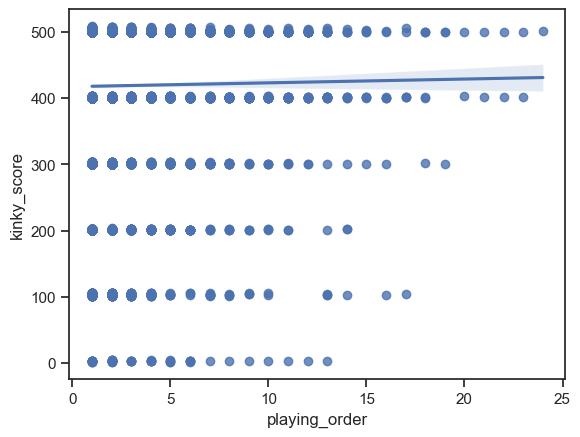

In [168]:
sns.regplot(x='playing_order', y='kinky_score', data=df_longterm)

Regression with content type

In [169]:
import statsmodels.api as sm

Y = df_longterm['content_type']
X = df_longterm[['playing_order']]
X['intercept'] = 1


model3 = sm.OLS(Y, X).fit() # Finds the best beta
print(model3.predict(X)) # The Y_pred (regression-line)
print(model3.summary())

121      2.645095
122      2.645095
123      2.614882
124      2.645095
125      2.645095
           ...   
25566    2.645095
25567    2.494029
25568    2.584669
25569    2.373176
25570    2.524242
Length: 10141, dtype: float64
                            OLS Regression Results                            
Dep. Variable:           content_type   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     142.4
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           1.33e-32
Time:                        11:09:52   Log-Likelihood:                -9104.2
No. Observations:               10141   AIC:                         1.821e+04
Df Residuals:                   10139   BIC:                         1.823e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/3321683451.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='content_type'>

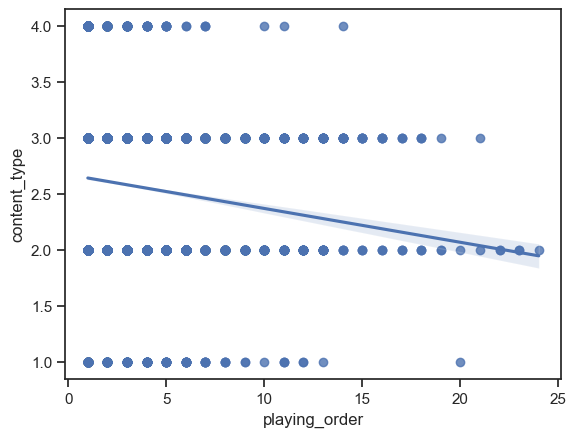

In [170]:
sns.regplot(x='playing_order', y='content_type', data=df_longterm)

Regression with genre

In [171]:
import statsmodels.api as sm

Y = df_longterm['genre']
X = df_longterm[['playing_order']]
X['intercept'] = 1


model4 = sm.OLS(Y, X).fit() # Finds the best beta
print(model4.predict(X)) # The Y_pred (regression-line)
print(model4.summary())

121      8.625483
122      8.625483
123      8.548123
124      8.625483
125      8.625483
           ...   
25566    8.625483
25567    8.238681
25568    8.470763
25569    7.929240
25570    8.316042
Length: 10141, dtype: float64
                            OLS Regression Results                            
Dep. Variable:                  genre   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     116.9
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           4.28e-27
Time:                        11:09:54   Log-Likelihood:                -19639.
No. Observations:               10141   AIC:                         3.928e+04
Df Residuals:                   10139   BIC:                         3.930e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/2696090571.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='genre'>

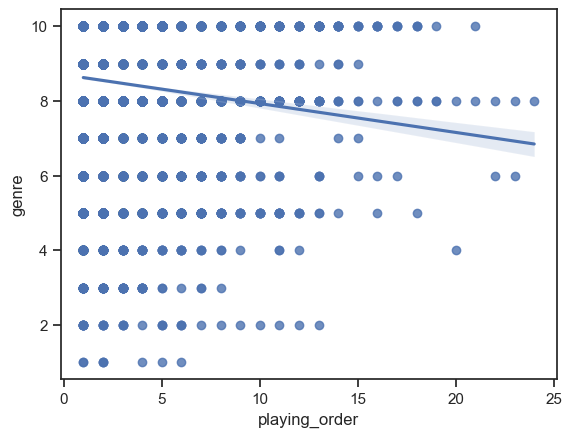

In [172]:
sns.regplot(x='playing_order', y='genre', data=df_longterm)

# Regression with only shortterm users

In [173]:
df_shortterm = df_trend[df_trend["longterm"] == 0]
df_shortterm

,index,story_id,longterm,voice_type,genre,language_intensity,kinky_score,fantasies,content_type,story_duration,play_duration,session_breakups_breakup,audio_intensity,audio_kinks,play_percentage,time_diff_user,session_id,num_audios,session_length,session_audio_played,playing_order,prev_audio
0,0,144,0,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,1644,1,0 days 00:00:00,60,1,0
1,1,144,0,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,7418,1,0 days 00:00:00,60,1,0
2,2,144,0,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,9082,1,0 days 00:00:00,60,1,0
3,3,144,0,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:00:00,9917,1,0 days 00:00:00,60,1,0
4,4,144,0,2,10,2,502,16,3,586,60,1,5,2,0.102389,0 days 00:02:00,5497,2,0 days 00:02:00,145,2,31440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25517,25517,34212,0,1,8,2,502,9,2,93,92,3,5,2,0.989247,1 days 23:58:00,4776,5,0 days 00:22:00,1919,1,0
25518,25518,34212,0,1,8,2,502,9,2,93,92,3,5,2,0.989247,11 days 16:31:51,9748,5,0 days 00:11:00,574,1,0
25519,25519,34212,0,1,8,2,502,9,2,93,92,4,5,2,0.989247,0 days 00:02:00,9096,14,0 days 01:03:00,4147,2,33372
25520,25520,34212,0,1,8,2,502,9,2,93,92,4,5,2,0.989247,0 days 00:02:00,10808,8,0 days 00:14:00,2688,6,34176


Regression with language intensity 

In [174]:
import statsmodels.api as sm

Y = df_shortterm['language_intensity']
X = df_shortterm[['playing_order']]
X['intercept'] = 1


model = sm.OLS(Y, X).fit() # Finds the best beta
print(model.predict(X)) # The Y_pred (regression-line)
print(model.summary())

0        2.179236
1        2.179236
2        2.179236
3        2.179236
4        2.179090
           ...   
25517    2.179236
25518    2.179236
25519    2.179090
25520    2.178509
25521    2.179236
Length: 15430, dtype: float64
                            OLS Regression Results                            
Dep. Variable:     language_intensity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                   0.01361
Date:                Tue, 06 Sep 2022   Prob (F-statistic):              0.907
Time:                        11:09:56   Log-Likelihood:                -12822.
No. Observations:               15430   AIC:                         2.565e+04
Df Residuals:                   15428   BIC:                         2.566e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/79477753.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='language_intensity'>

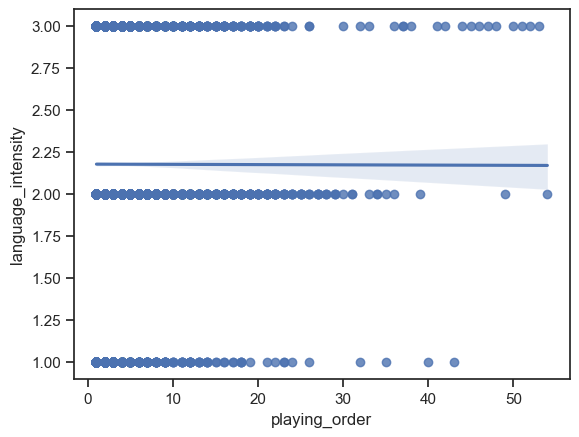

In [175]:
sns.regplot(x='playing_order', y='language_intensity', data=df_shortterm)

Regression with kinky score

In [176]:
import statsmodels.api as sm

Y = df_shortterm['kinky_score']
X = df_shortterm[['playing_order']]
X['intercept'] = 1

model2 = sm.OLS(Y, X).fit() # Finds the best beta
print(model2.predict(X)) # The Y_pred (regression-line)
print(model2.summary())

0        408.165190
1        408.165190
2        408.165190
3        408.165190
4        408.899938
            ...    
25517    408.165190
25518    408.165190
25519    408.899938
25520    411.838929
25521    408.165190
Length: 15430, dtype: float64
                            OLS Regression Results                            
Dep. Variable:            kinky_score   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     8.013
Date:                Tue, 06 Sep 2022   Prob (F-statistic):            0.00465
Time:                        11:10:00   Log-Likelihood:                -95218.
No. Observations:               15430   AIC:                         1.904e+05
Df Residuals:                   15428   BIC:                         1.905e+05
Df Model:                           1                                         
Covariance Type:            nonrobust  

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/1808556536.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='kinky_score'>

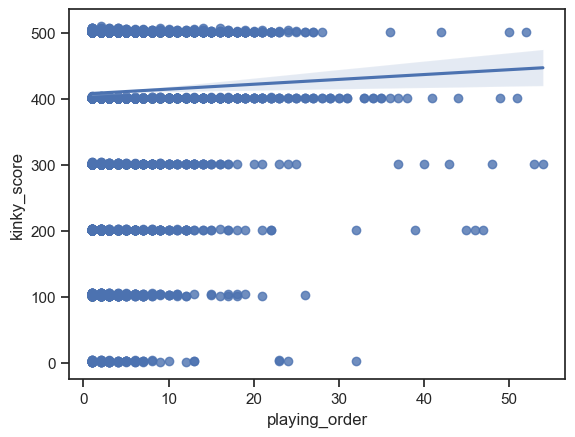

In [177]:
sns.regplot(x='playing_order', y='kinky_score', data=df_shortterm)

Regression with content type

In [178]:
import statsmodels.api as sm

Y = df_shortterm['content_type']
X = df_shortterm[['playing_order']]
X['intercept'] = 1


model3 = sm.OLS(Y, X).fit() # Finds the best beta
print(model3.predict(X)) # The Y_pred (regression-line)
print(model3.summary())

0        2.595763
1        2.595763
2        2.595763
3        2.595763
4        2.582592
           ...   
25517    2.595763
25518    2.595763
25519    2.582592
25520    2.529911
25521    2.595763
Length: 15430, dtype: float64
                            OLS Regression Results                            
Dep. Variable:           content_type   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     87.42
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           9.94e-21
Time:                        11:10:03   Log-Likelihood:                -14730.
No. Observations:               15430   AIC:                         2.946e+04
Df Residuals:                   15428   BIC:                         2.948e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/2558588739.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='content_type'>

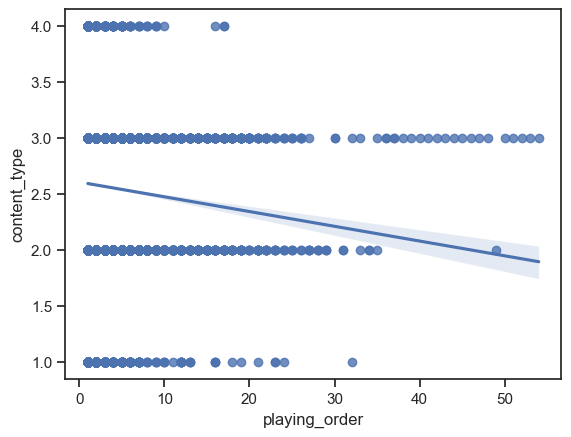

In [179]:
sns.regplot(x='playing_order', y='content_type', data=df_shortterm)

Regression with genre

In [180]:
import statsmodels.api as sm

Y = df_shortterm['genre']
X = df_shortterm[['playing_order']]
X['intercept'] = 1


model4 = sm.OLS(Y, X).fit() # Finds the best beta
print(model4.predict(X)) # The Y_pred (regression-line)
print(model4.summary())

0        8.433085
1        8.433085
2        8.433085
3        8.433085
4        8.388823
           ...   
25517    8.433085
25518    8.433085
25519    8.388823
25520    8.211776
25521    8.433085
Length: 15430, dtype: float64
                            OLS Regression Results                            
Dep. Variable:                  genre   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     111.7
Date:                Tue, 06 Sep 2022   Prob (F-statistic):           5.20e-26
Time:                        11:10:07   Log-Likelihood:                -31545.
No. Observations:               15430   AIC:                         6.309e+04
Df Residuals:                   15428   BIC:                         6.311e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                        

/var/folders/c1/nrgf0h0964zbt7q_tc2xgv_m0000gn/T/ipykernel_3386/2745154991.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


<AxesSubplot:xlabel='playing_order', ylabel='genre'>

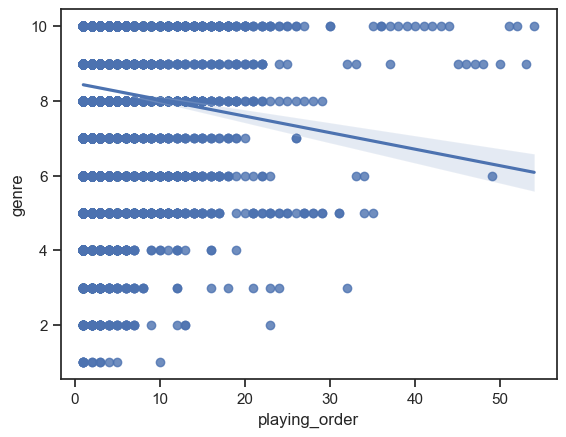

In [181]:
sns.regplot(x='playing_order', y='genre', data=df_shortterm)

Clustering


In [182]:
import plotly.express as px

In [183]:
df_trend_less = df_trend.drop(columns = ['session_length', 'time_diff_user'], axis =1)

In [184]:


trend_km = KMeans(n_clusters=8)
trend_km.fit(df_trend_less)
labels_trend = trend_km.labels_
trend_km_pred = trend_km.fit_predict(df_trend_less)

km_story = KMeans(n_clusters=8)
km_story.fit(story_df)
km_story_pred = km_story.fit_predict(story_df)
labels_story = km_story.labels_
labels_story

array([1, 2, 1, ..., 2, 2, 3], dtype=int32)

/Users/sophiemartusewicz/.pyenv/versions/3.8.12/envs/lewagon_x_femtasy/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

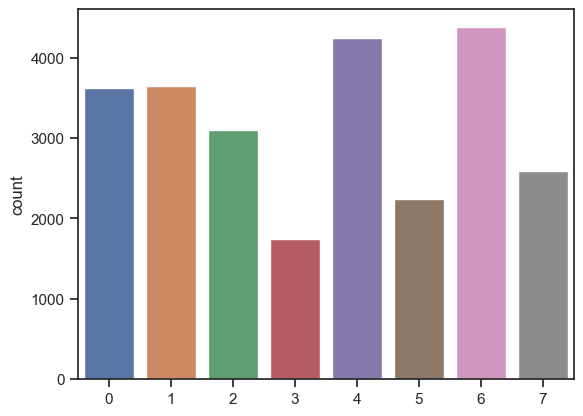

In [185]:
#division between clusters 
sns.countplot(trend_km_pred)

/Users/sophiemartusewicz/.pyenv/versions/3.8.12/envs/lewagon_x_femtasy/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

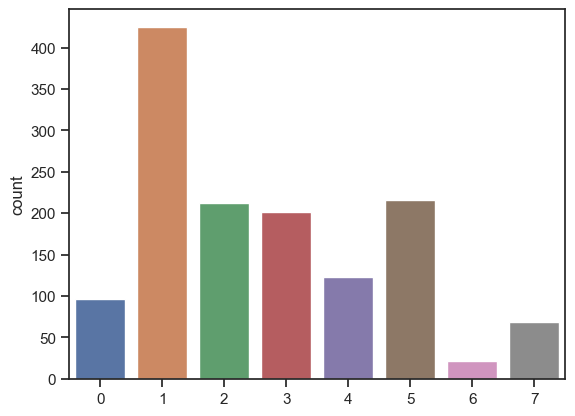

In [186]:
#division between clusters 
sns.countplot(km_story_pred) 

In [187]:
fig = px.scatter_3d(df_trend_less, 
                    x = 'audio_intensity',
                    y = 'audio_kinks',
                    z = 'play_percentage',
                    color = labels_trend , width=500, height=500)

fig.show()

In [188]:
fig = px.scatter_3d(story_df, 
                    x = 'voice_type',
                    y = 'playing_order',
                    z = 'num_audios',
                    color = labels_story, width=500, height=500)
fig.show()

In [189]:
fig = px.scatter_3d(df_trend_less, 
                    x = 'prev_audio',
                    z = 'audio_intensity',
                    y = 'genre',
                    color = labels_trend, width=500, height=500)
fig.show()

In [190]:
x = df_trend.iloc[:,[3,4]].values

In [207]:


model = KMeans(n_clusters = 3, init = "k-means++", max_iter = 300, n_init = 10, random_state = 0)
y_clusters = model.fit_predict(x)

In [204]:
x = df_trend[['playing_order','kinky_score','language_intensity']].values

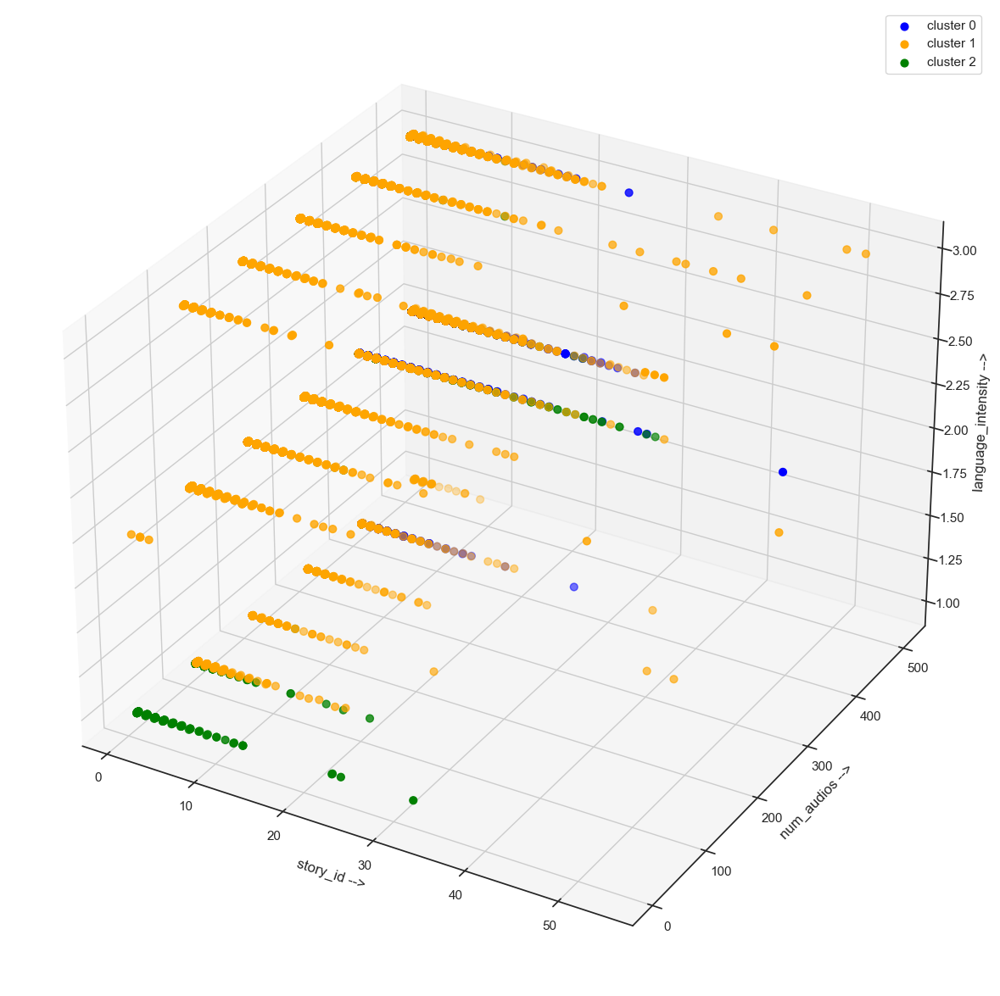

In [206]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[y_clusters == 0,0],x[y_clusters == 0,1],x[y_clusters == 0,2], s = 40 , color = 'blue', label = "cluster 0")
ax.scatter(x[y_clusters == 1,0],x[y_clusters == 1,1],x[y_clusters == 1,2], s = 40 , color = 'orange', label = "cluster 1")
ax.scatter(x[y_clusters == 2,0],x[y_clusters == 2,1],x[y_clusters == 2,2], s = 40 , color = 'green', label = "cluster 2")
#ax.scatter(x[y_clusters == 3,0],x[y_clusters == 3,1],x[y_clusters == 3,2], s = 40 , color = 'black', label = "cluster 3")
#ax.scatter(x[y_clusters == 4,0],x[y_clusters == 4,1],x[y_clusters == 4,2], s = 40 , color = 'purple', label = "cluster 4")
ax.set_xlabel('story_id -->')
ax.set_ylabel('num_audios -->')
ax.set_zlabel('language_intensity -->')
ax.legend()
plt.show()

In [194]:
# 3d scatterplot using plotly
import plotly.graph_objects as go
Scene = dict(xaxis = dict(title  = 'story_id -->'),yaxis = dict(title  = 'num_audios--->'),zaxis = dict(title  = 'language_intensity -->'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = model.labels_
trace = go.Scatter3d(x=x[:, 0], y=x[:, 1], z=x[:, 2], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [195]:
story_df = story_df.reset_index()
story_df = story_df.drop(columns=['genre', 'voice_type', 'content_type'])


In [196]:
story_df

,story_id,language_intensity,fantasies,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10,ct_1,ct_2,ct_3,ct_4
0,144,2,16,586,278.452381,5,2,1.611111,2.789683,2,0.577525,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
1,168,2,3,709,363.163934,5,2,2.573770,3.754098,2,0.685590,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
2,216,2,18,580,292.134328,3,2,2.104478,3.203980,2,0.656832,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3,228,3,35,522,333.857143,5,1,2.500000,3.714286,2,0.673077,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
4,252,1,4,932,393.444444,1,6,1.944444,2.388889,2,0.813953,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1359,34164,2,46,493,313.170103,5,1,2.865979,4.912371,2,0.583421,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1360,34176,2,16,454,290.948805,4,2,2.617747,4.552901,2,0.574963,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1361,34188,2,9,666,369.028986,5,1,3.550725,6.942029,2,0.511482,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1362,34200,2,9,666,283.000000,5,1,1.000000,2.000000,3,0.500000,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [197]:
knn_X = story_df.drop(columns=['story_id'] )
knn_y = story_df['story_id']
knn_model = KNeighborsRegressor().fit(knn_X,knn_y)

In [198]:
current_story = story_df.where(story_df.story_id == 34164).dropna()

In [199]:
current_story

,story_id,language_intensity,fantasies,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10,ct_1,ct_2,ct_3,ct_4
1359,34164.0,2.0,46.0,493.0,313.170103,5.0,1.0,2.865979,4.912371,2.0,0.583421,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [200]:
neig = knn_model.kneighbors(current_story.drop(columns=['story_id']),n_neighbors=2)

In [201]:
story_df.iloc[neig[1][0][1]]

story_id                780.000000
language_intensity        1.000000
fantasies                31.000000
story_duration          491.000000
play_duration           313.750000
audio_intensity           5.000000
audio_kinks               4.000000
playing_order             1.500000
num_audios                5.250000
session_breakup_mode      2.000000
order_relative            0.285714
vt_1                      0.000000
vt_2                      1.000000
vt_3                      0.000000
vt_5                      0.000000
vt_4                      0.000000
genre_1                   0.000000
genre_2                   0.000000
genre_3                   0.000000
genre_4                   0.000000
genre_5                   0.000000
genre_6                   0.000000
genre_7                   0.000000
genre_8                   0.000000
genre_9                   0.000000
genre_10                  1.000000
ct_1                      0.000000
ct_2                      0.000000
ct_3                

In [202]:
story_df.where(story_df.story_id == 34104).dropna()

,story_id,language_intensity,fantasies,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10,ct_1,ct_2,ct_3,ct_4
1356,34104.0,2.0,9.0,489.0,307.564972,5.0,1.0,3.20904,6.022599,2.0,0.532833,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [203]:
current_story

,story_id,language_intensity,fantasies,story_duration,play_duration,audio_intensity,audio_kinks,playing_order,num_audios,session_breakup_mode,order_relative,vt_1,vt_2,vt_3,vt_5,vt_4,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,genre_9,genre_10,ct_1,ct_2,ct_3,ct_4
1359,34164.0,2.0,46.0,493.0,313.170103,5.0,1.0,2.865979,4.912371,2.0,0.583421,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
